In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering,KMeans,DBSCAN
import scipy.cluster.hierarchy as sch
from sklearn.metrics import silhouette_score,davies_bouldin_score
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import Normalizer, MinMaxScaler

In [ ]:
gd= pd.read_excel(r"C:\Users\my computer\Documents\Data Science\Projects\P342-Cluster\World_development_mesurement (1) (1).xlsx")
gd

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


#EDA

In [ ]:
gd.shape

(2704, 25)

In [ ]:
#making copy of the given dataset
gd1= gd.copy()
gd1.head(20)

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
5,0.042,NaN,301.0,Burundi,NaN,NaN,NaN,"$870,486,066",0.063,$7,...,47.0,0.0,1,0.490,0.481,0.029,6674286,0.082,"$1,400,000","$14,000,000"
6,0.041,NaN,3432.0,Cameroon,NaN,NaN,6310.0,"$9,287,367,569",0.044,$26,...,51.0,0.0,1,0.453,0.513,0.034,15927713,0.455,"$132,000,000","$241,000,000"
7,0.039,NaN,268.0,Central African Republic,NaN,NaN,NaN,"$914,500,332",0.043,$11,...,42.0,0.0,1,0.423,0.537,0.040,3638316,0.376,"$5,000,000","$33,000,000"
8,0.051,NaN,176.0,Chad,NaN,NaN,NaN,"$1,385,058,212",0.063,$10,...,46.0,0.0,1,0.490,0.482,0.028,8301151,0.216,"$14,000,000","$56,000,000"
9,0.039,NaN,84.0,Comoros,NaN,NaN,NaN,"$201,899,884",0.035,$13,...,56.0,NaN,1,0.415,0.554,0.031,528312,0.281,"$15,000,000",NaN


In [ ]:
gd1.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [ ]:
gd1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

#Data Cleansing

In [ ]:
gd1['Number of Records'].unique()

array([1], dtype=int64)

No.of records is not usefull for making clusters so we will drop that column

In [ ]:
gd1.drop(['Number of Records'],axis=1,inplace=True)

In [ ]:
gd1.shape

(2704, 24)

In [ ]:
gd1.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2699    False
2700    False
2701    False
2702    False
2703    False
Length: 2704, dtype: bool

In [ ]:
gd1[gd1.duplicated()].shape

(0, 24)

No duplicates are present in the given dataset

In [ ]:
gd1['Business Tax Rate'] = gd1['Business Tax Rate'].str.replace('%', '')
gd1['Business Tax Rate'] = pd.to_numeric(gd1['Business Tax Rate'])

gd1['GDP'] = gd1['GDP'].str.replace('$', '').str.replace(',', '')
gd1['GDP'] = pd.to_numeric(gd1['GDP'])

gd1['Health Exp/Capita'] = gd1['Health Exp/Capita'].str.replace('$', '').str.replace(',', '')
gd1['Health Exp/Capita'] = pd.to_numeric(gd1['Health Exp/Capita'])

gd1['Tourism Inbound'] = gd1['Tourism Inbound'].str.replace('$', '').str.replace(',', '')
gd1['Tourism Inbound'] = pd.to_numeric(gd1['Tourism Inbound'])

gd1['Tourism Outbound'] = gd1['Tourism Outbound'].str.replace('$', '').str.replace(',', '')
gd1['Tourism Outbound'] = pd.to_numeric(gd1['Tourism Outbound'])

gd1['Population Total'] = gd1['Population Total'].astype(float)

Removed ' $ ', ' % ', ' , ' from dataset and converted datatype to float

In [ ]:
gd1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   float64
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   float64
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [ ]:
gd1.isna().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

Dropping Ease of business column it has more null values

In [ ]:
gd1=gd1.drop("Ease of Business" , axis=1)

In [ ]:
gd1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   float64
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Energy Usage            1785 non-null   float64
 6   GDP                     2494 non-null   float64
 7   Health Exp % GDP        2395 non-null   float64
 8   Health Exp/Capita       2395 non-null   float64
 9   Hours to do Tax         1416 non-null   float64
 10  Infant Mortality Rate   2444 non-null   float64
 11  Internet Usage          2531 non-null   float64
 12  Lending Interest        1880 non-null   float64
 13  Life Expectancy Female  2568 non-null   float64
 14  Life Expectancy Male    2568 non-null   

In [ ]:
gd2 = gd1.drop("Country",axis=1)

In [ ]:
gd2.columns

Index(['Birth Rate', 'Business Tax Rate', 'CO2 Emissions',
       'Days to Start Business', 'Energy Usage', 'GDP', 'Health Exp % GDP',
       'Health Exp/Capita', 'Hours to do Tax', 'Infant Mortality Rate',
       'Internet Usage', 'Lending Interest', 'Life Expectancy Female',
       'Life Expectancy Male', 'Mobile Phone Usage', 'Population 0-14',
       'Population 15-64', 'Population 65+', 'Population Total',
       'Population Urban', 'Tourism Inbound', 'Tourism Outbound'],
      dtype='object')

In [ ]:
gd2

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,NaN,26998.0,5.479006e+10,0.035,60.0,NaN,0.034,...,71.0,67.0,0.0,0.342,0.619,0.039,31719449.0,0.599,1.020000e+08,1.930000e+08
1,0.050,NaN,9542.0,NaN,7499.0,9.129595e+09,0.034,22.0,NaN,0.128,...,47.0,44.0,0.0,0.476,0.499,0.025,13924930.0,0.324,3.400000e+07,1.460000e+08
2,0.043,NaN,1617.0,NaN,1983.0,2.359122e+09,0.043,15.0,NaN,0.090,...,57.0,53.0,0.0,0.454,0.517,0.029,6949366.0,0.383,7.700000e+07,5.000000e+07
3,0.027,NaN,4276.0,NaN,1836.0,5.788312e+09,0.047,152.0,NaN,0.054,...,52.0,49.0,0.1,0.383,0.587,0.029,1755375.0,0.532,2.270000e+08,2.090000e+08
4,0.046,NaN,1041.0,NaN,NaN,2.610959e+09,0.051,12.0,NaN,0.096,...,52.0,49.0,0.0,0.468,0.505,0.028,11607944.0,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,32427.0,0.911,NaN,NaN
2700,0.013,46.4,NaN,5.0,2132446.0,1.624460e+13,0.179,8895.0,175.0,0.006,...,81.0,76.0,1.0,0.196,0.667,0.136,313873685.0,0.811,2.000920e+11,1.265730e+11
2701,0.015,41.9,NaN,7.0,NaN,5.000435e+10,0.089,1308.0,310.0,0.010,...,80.0,74.0,1.5,0.220,0.639,0.140,3395253.0,0.948,2.222000e+09,1.028000e+09
2702,0.020,61.9,NaN,144.0,NaN,3.812862e+11,0.046,593.0,792.0,0.013,...,78.0,72.0,1.0,0.288,0.652,0.060,29954782.0,0.889,9.040000e+08,3.202000e+09


In [ ]:
from sklearn.impute import KNNImputer
knnimputer=KNNImputer(n_neighbors=3)
df_impute=gd2
imputed=knnimputer.fit_transform(df_impute)
df_imputed=pd.DataFrame(imputed, columns=df_impute.columns)
df_imputed

,Birth Rate,Business Tax Rate,CO2 Emissions,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,Infant Mortality Rate,...,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020000,44.033333,87931.000000,32.666667,2.699800e+04,5.479006e+10,0.035000,60.0,275.666667,0.034,...,71.000000,67.000000,0.000000,0.342,0.619000,0.039000,31719449.0,0.599,1.020000e+08,1.930000e+08
1,0.050000,40.533333,9542.000000,22.000000,7.499000e+03,9.129595e+09,0.034000,22.0,241.333333,0.128,...,47.000000,44.000000,0.000000,0.476,0.499000,0.025000,13924930.0,0.324,3.400000e+07,1.460000e+08
2,0.043000,40.533333,1617.000000,22.000000,1.983000e+03,2.359122e+09,0.043000,15.0,241.333333,0.090,...,57.000000,53.000000,0.000000,0.454,0.517000,0.029000,6949366.0,0.383,7.700000e+07,5.000000e+07
3,0.027000,40.533333,4276.000000,22.000000,1.836000e+03,5.788312e+09,0.047000,152.0,241.333333,0.054,...,52.000000,49.000000,0.100000,0.383,0.587000,0.029000,1755375.0,0.532,2.270000e+08,2.090000e+08
4,0.046000,54.633333,1041.000000,36.666667,1.348933e+04,2.610959e+09,0.051000,12.0,296.000000,0.096,...,52.000000,49.000000,0.000000,0.468,0.505000,0.028000,11607944.0,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.011667,48.933333,160.000000,26.000000,7.800000e+01,2.741753e+09,0.033333,2796.0,132.000000,0.004,...,82.666667,76.666667,0.433333,0.291,0.638667,0.070333,32427.0,0.911,5.036667e+08,1.403333e+08
2700,0.013000,46.400000,79142.666667,5.000000,2.132446e+06,1.624460e+13,0.179000,8895.0,175.000000,0.006,...,81.000000,76.000000,1.000000,0.196,0.667000,0.136000,313873685.0,0.811,2.000920e+11,1.265730e+11
2701,0.015000,41.900000,590.333333,7.000000,2.226300e+04,5.000435e+10,0.089000,1308.0,310.000000,0.010,...,80.000000,74.000000,1.500000,0.220,0.639000,0.140000,3395253.0,0.948,2.222000e+09,1.028000e+09
2702,0.020000,61.900000,79142.666667,144.000000,2.163900e+04,3.812862e+11,0.046000,593.0,792.000000,0.013,...,78.000000,72.000000,1.000000,0.288,0.652000,0.060000,29954782.0,0.889,9.040000e+08,3.202000e+09


In [ ]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2704 non-null   float64
 1   Business Tax Rate       2704 non-null   float64
 2   CO2 Emissions           2704 non-null   float64
 3   Days to Start Business  2704 non-null   float64
 4   Energy Usage            2704 non-null   float64
 5   GDP                     2704 non-null   float64
 6   Health Exp % GDP        2704 non-null   float64
 7   Health Exp/Capita       2704 non-null   float64
 8   Hours to do Tax         2704 non-null   float64
 9   Infant Mortality Rate   2704 non-null   float64
 10  Internet Usage          2704 non-null   float64
 11  Lending Interest        2704 non-null   float64
 12  Life Expectancy Female  2704 non-null   float64
 13  Life Expectancy Male    2704 non-null   float64
 14  Mobile Phone Usage      2704 non-null   

In [ ]:
df_imputed=df_imputed.rename(columns={'Birth Rate':'Birth_Rate','Business Tax Rate':'BusinessTaxRate','CO2 Emissions':'CO2_Emissions','Days to Start Business':'DaystoStartBusiness',
                       'Ease of Business':'EaseofBusiness','Energy Usage':'Energy_Usage','Health Exp/Capita':'Health_Exp/Capita','Health Exp % GDP':'HealthExp_GDP',
                       'Hours to do Tax':'HourstodoTax','Infant Mortality Rate':'InfantMortalityRate',
                       'Internet Usage':'Internet_Usage','Lending Interest':'Lending_Interest','Life Expectancy Female':'LifeExpectancyFemale',
                       'Life Expectancy Male':'LifeExpectancyMale','Mobile Phone Usage':'MobilePhoneUsage',
                       'Population 0-14':'Population0-14','Population 15-64':'Population15-64',
                       'Population 65+':'Population65+','Population Total':'Population_Total',
                       'Population Urban':'Population_Urban','Tourism Inbound':'Tourism_Inbound',
                       'Tourism Outbound':'Tourism_Outbound'})

#Data Visualization

#Pairplot

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


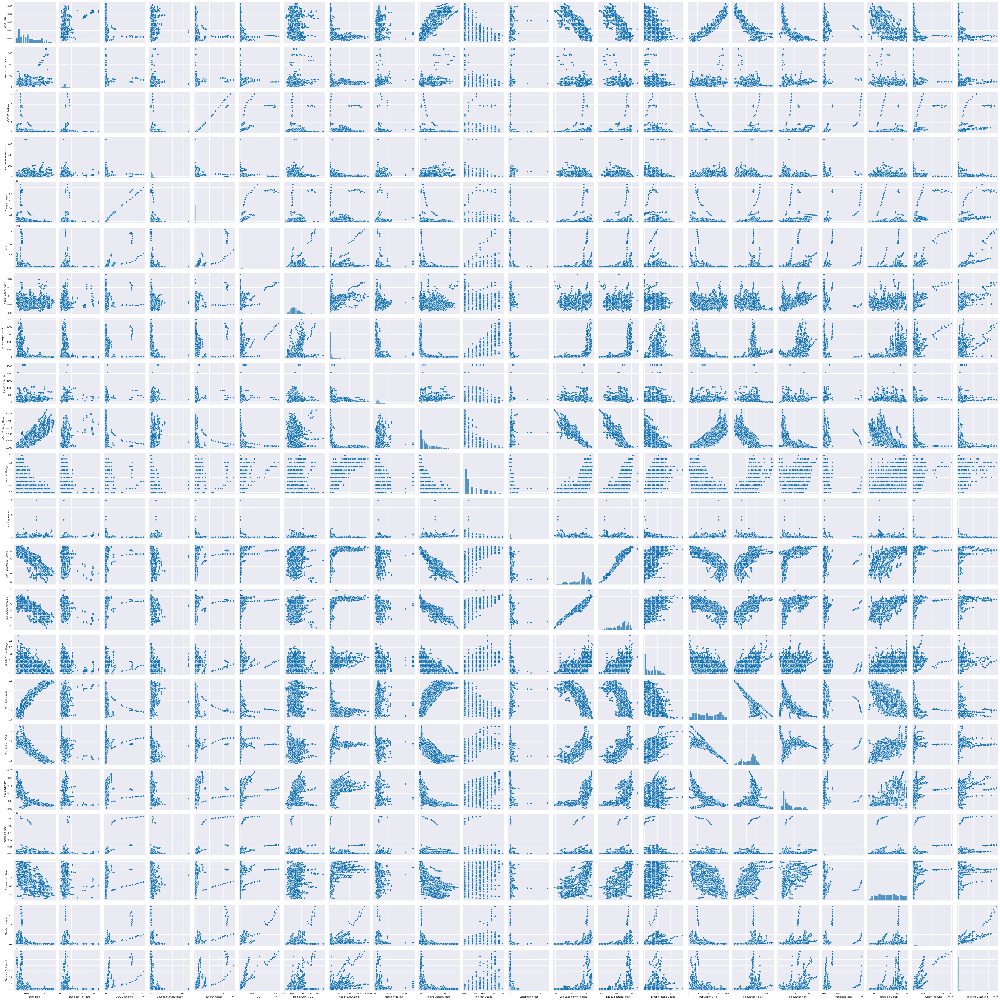

In [ ]:
sns.set_style(style='darkgrid')
sns.pairplot(gd2)

#Histogram

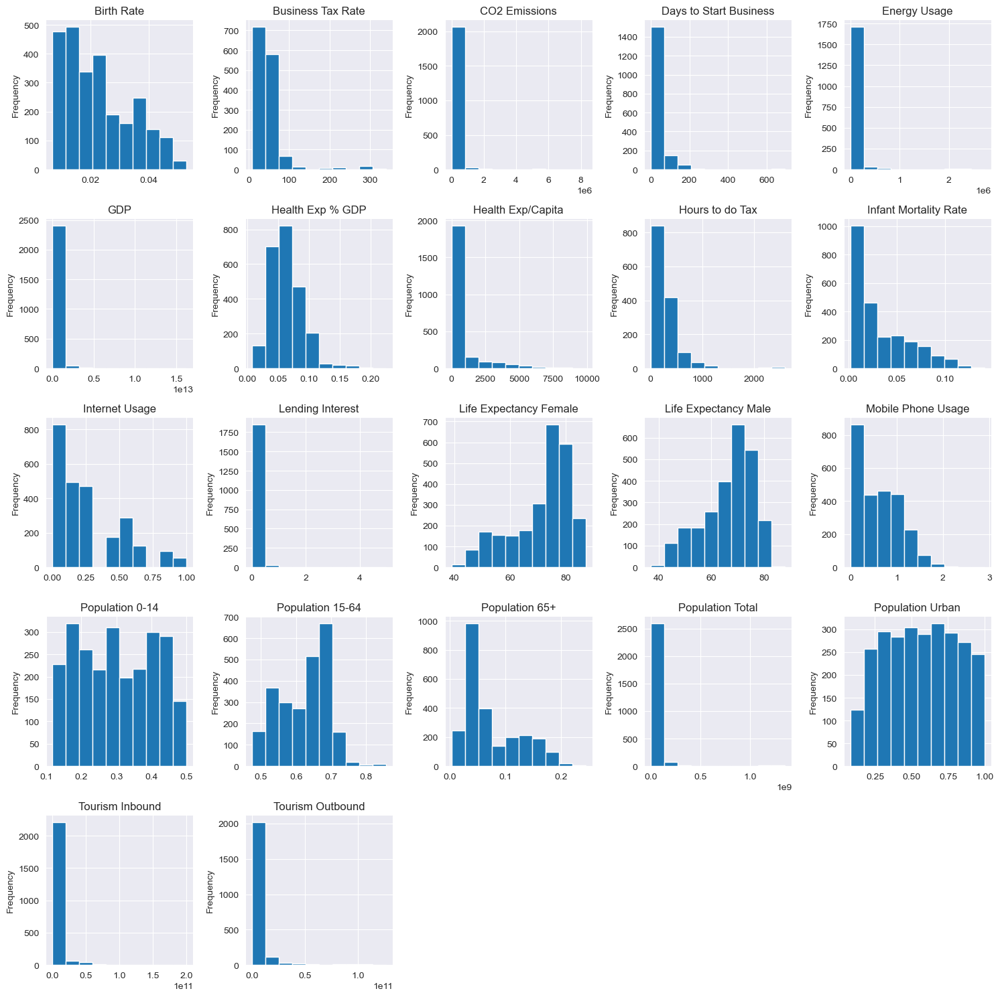

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))
for i, ax in enumerate(axes.flatten()):
    if i < len(gd2.columns):
        gd2[gd2.columns[i]].plot(kind='hist', ax=ax)
        ax.set_title(gd2.columns[i])
    else:
        ax.axis('off')
plt.tight_layout()
plt.show()


Histogram tells about the distribution of the data points

#Distplot

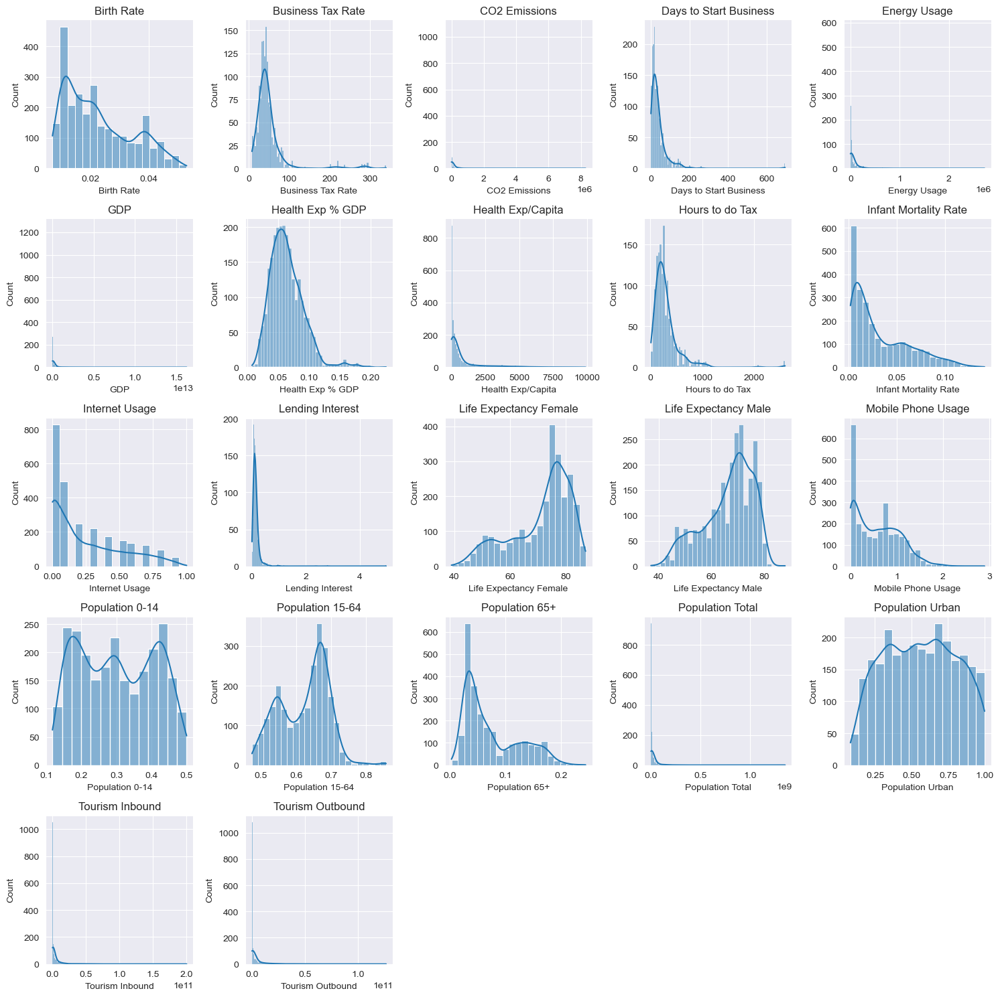

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

# Loop through each column and plot distplot
for i, ax in enumerate(axes.flatten()):
    if i < len(gd2.columns):
        sns.histplot(gd2[gd2.columns[i]], ax=ax, kde=True)
        ax.set_title(gd2.columns[i])
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

Business Tax Rate, Ease of Business, Health Exp % GDP, Hours to do Tax, Population 0-14, Population Urban has normal distribution and the remaining columns have positive skewness/negative skewness present.

#Bubble plot

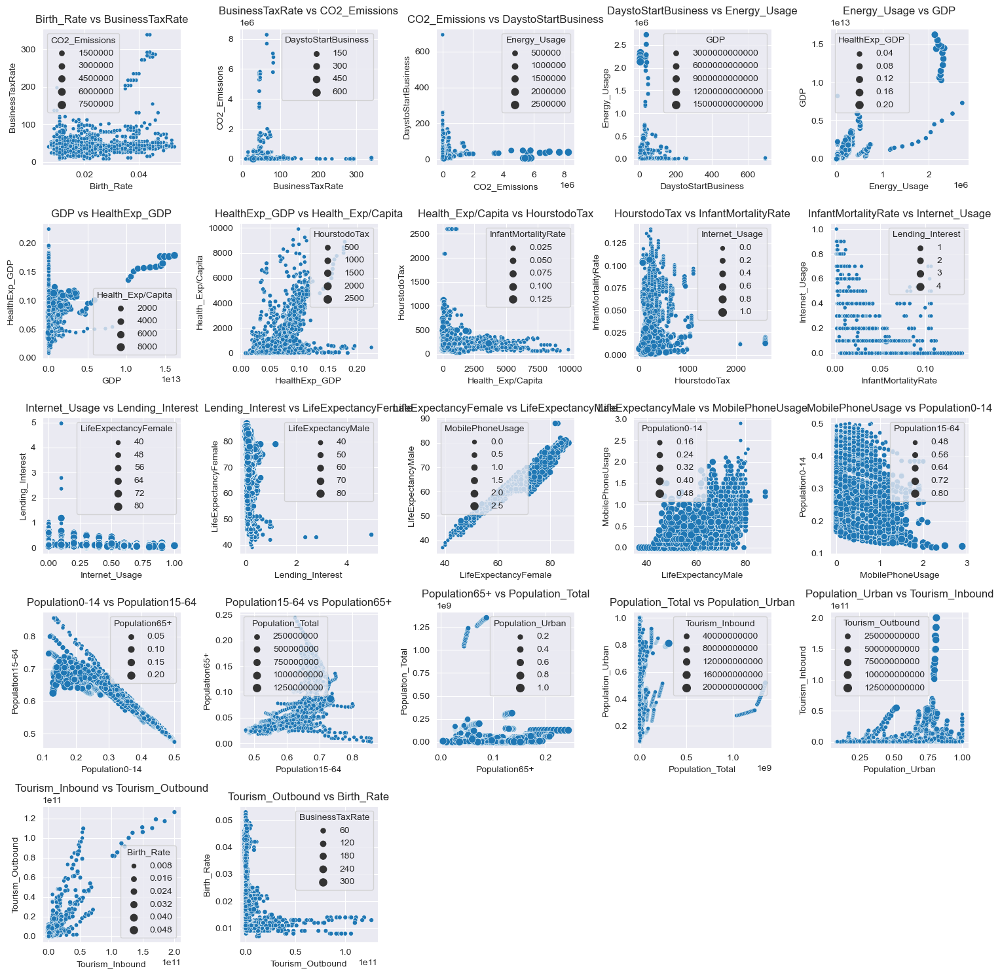

In [ ]:
numeric_columns = df_imputed.select_dtypes(include='number').columns

# Set up subplots
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

for i, ax in enumerate(axes.flatten()):
    if i < len(numeric_columns):
        # Generate bubble chart
        sns.scatterplot(x=numeric_columns[i], y=numeric_columns[(i+1) % len(numeric_columns)], size=numeric_columns[(i+2) % len(numeric_columns)], data=df_imputed, ax=ax)
        ax.set_title(f"{numeric_columns[i]} vs {numeric_columns[(i+1) % len(numeric_columns)]}")
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

#Line plot

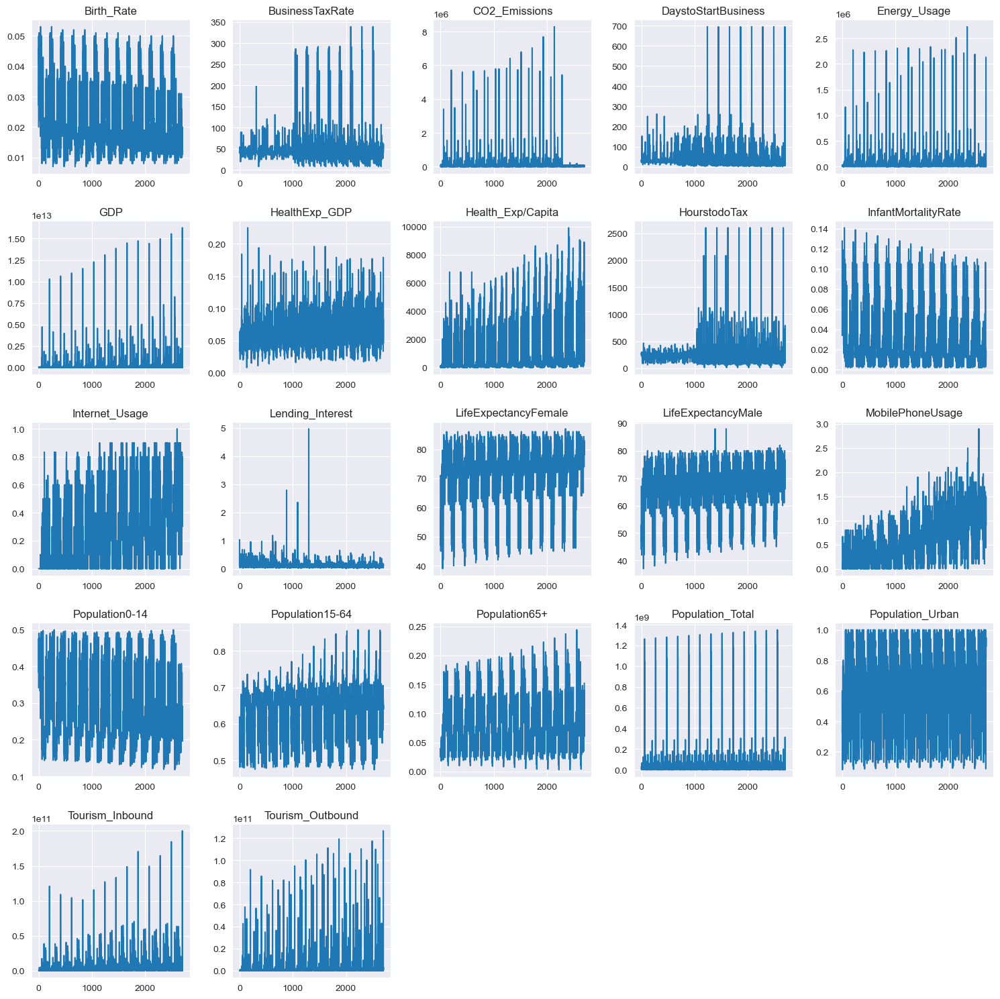

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

for i, ax in enumerate(axes.flatten()):
    if i < len(df_imputed.columns):
        # Check if the column contains numeric data
        if pd.api.types.is_numeric_dtype(df_imputed[df_imputed.columns[i]]):
            df_imputed[df_imputed.columns[i]].plot(kind='line', ax=ax)
            ax.set_title(df_imputed.columns[i])
        else:
            ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

#Violin plot

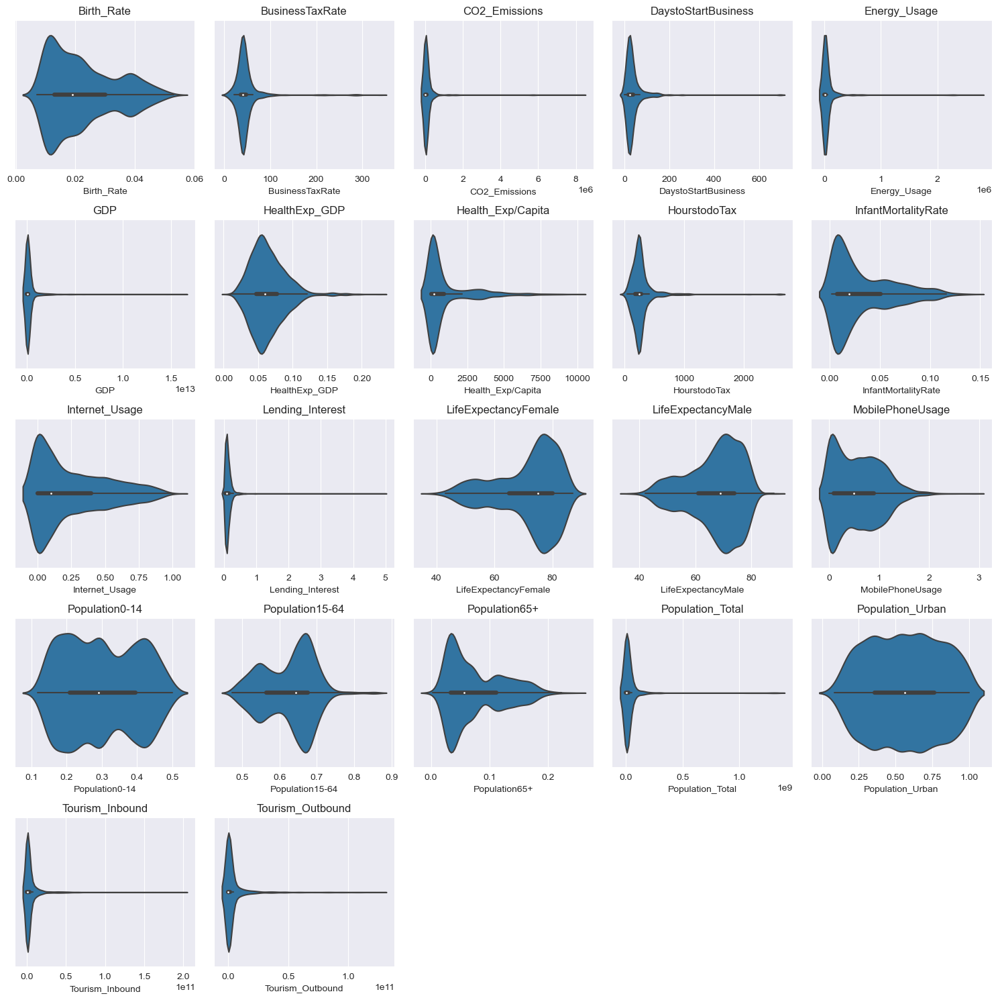

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

for i, ax in enumerate(axes.flatten()):
    if i < len(df_imputed.columns):
        if pd.api.types.is_numeric_dtype(df_imputed[df_imputed.columns[i]]):
            sns.violinplot(x=df_imputed[df_imputed.columns[i]], ax=ax)
            ax.set_title(df_imputed.columns[i])
        else:
            ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

violin plot indicates that lot of outliers are present in dataset and uneven distribution of data.

#Boxplot

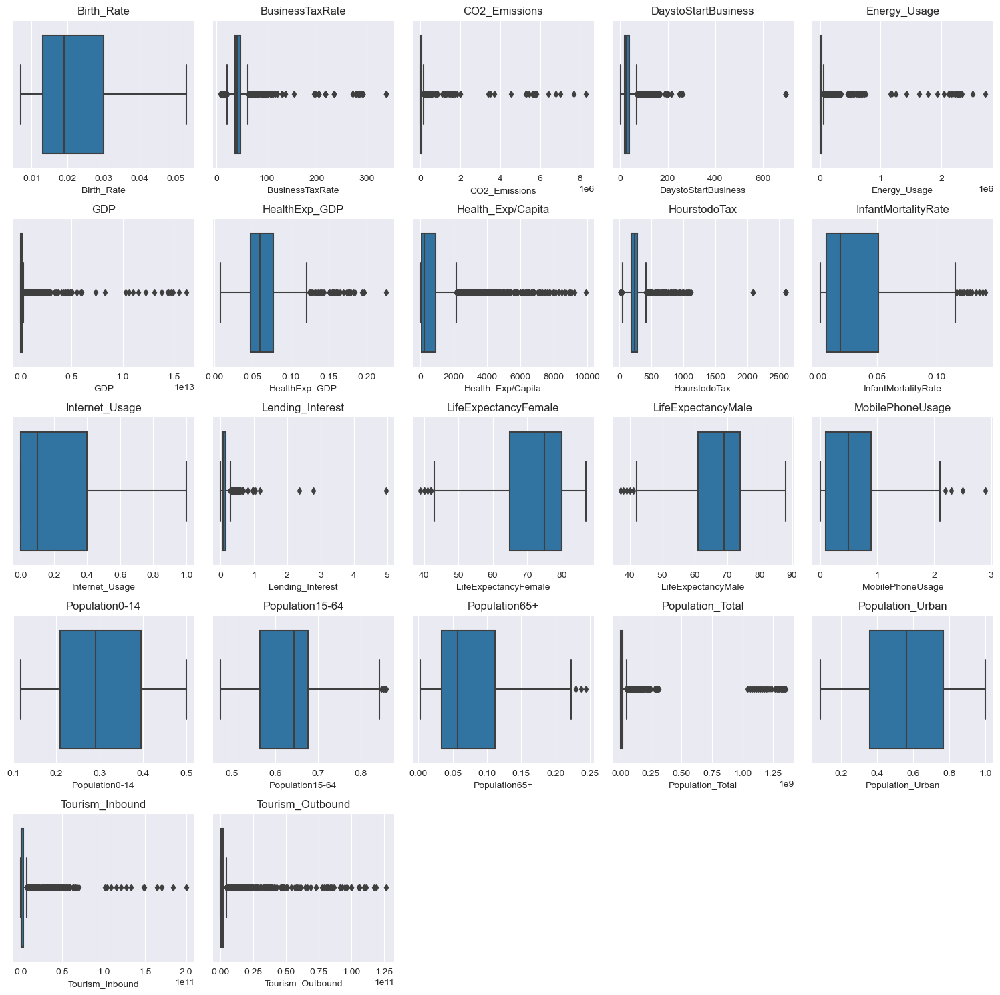

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

# Loop through each column and plot boxplot
for i, ax in enumerate(axes.flatten()):
    if i < len(df_imputed.columns):
        sns.boxplot(x=df_imputed[df_imputed.columns[i]], ax=ax)
        ax.set_title(df_imputed.columns[i])
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

#Heat map

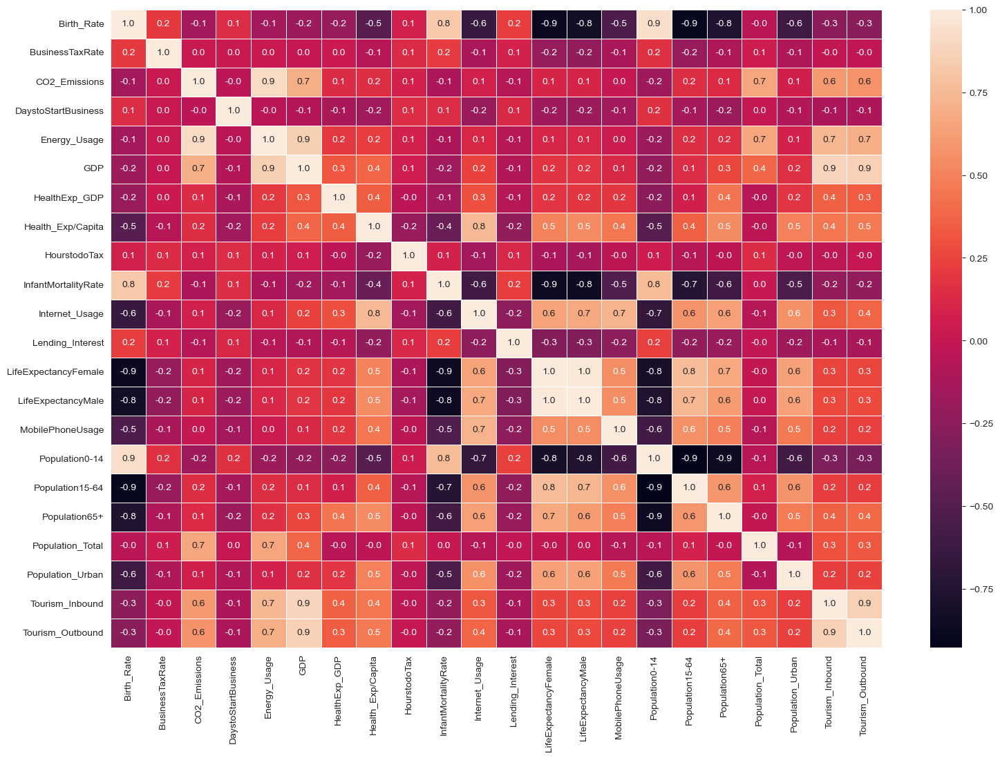

In [ ]:
f,ax = plt.subplots(figsize=(18,12))
sns.heatmap(df_imputed.corr(), annot=True, linewidths =.5, fmt ='.1f',ax=ax)
plt.show()

From correlation matrix we found out that "LifeExpectancyFemale" and "LifeExpectancyMale" have a correlation coefficient of 1."Tourism_Inbound" and "Tourism_Outbound" have almost identical correlation patterns with other variables,it suggests that these variables are highly correlated and likely redundant.

In [ ]:
df_imputed = df_imputed.drop("LifeExpectancyMale",axis=1)

In [ ]:
df_imputed= df_imputed.drop("Tourism_Outbound",axis=1)

In [ ]:
df_imputed["Country"] = gd1['Country']

In [ ]:
label_encoder=LabelEncoder()
df_imputed['Encoded_Countries']=label_encoder.fit_transform(df_imputed['Country'])
df_imputed['Encoded_Countries']=df_imputed['Encoded_Countries'].astype(float)

In [ ]:
df_imputed.drop(['Country'],axis=1,inplace=True)

# Outlier Treatment

In [ ]:
import pandas as pd

def count_outliers_iqr(data):
    outliers_count = {}
    for column in data.columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers_count[column] = ((data[column] < lower_bound) | (data[column] > upper_bound)).sum()
    return outliers_count

outliers_counts = count_outliers_iqr(df_imputed)
for column, count in outliers_counts.items():
    print(f"{column}: {count}")

Birth_Rate: 0
BusinessTaxRate: 376
CO2_Emissions: 325
DaystoStartBusiness: 271
Energy_Usage: 388
GDP: 392
HealthExp_GDP: 57
Health_Exp/Capita: 467
HourstodoTax: 284
InfantMortalityRate: 19
Internet_Usage: 0
Lending_Interest: 117
LifeExpectancyFemale: 8
MobilePhoneUsage: 4
Population0-14: 0
Population15-64: 8
Population65+: 3
Population_Total: 318
Population_Urban: 0
Tourism_Inbound: 387
Encoded_Countries: 0


### Method 1

In [ ]:
## Square Root Transformation
df1=np.sqrt(df_imputed)
df1

,Birth_Rate,BusinessTaxRate,CO2_Emissions,DaystoStartBusiness,Energy_Usage,GDP,HealthExp_GDP,Health_Exp/Capita,HourstodoTax,InfantMortalityRate,...,Lending_Interest,LifeExpectancyFemale,MobilePhoneUsage,Population0-14,Population15-64,Population65+,Population_Total,Population_Urban,Tourism_Inbound,Encoded_Countries
0,0.141421,6.635762,296.531617,5.715476,164.310681,2.340728e+05,0.187083,7.745967,16.603213,0.184391,...,0.316228,8.426150,0.000000,0.584808,0.786766,0.197484,5632.002219,0.773951,10099.504938,1.414214
1,0.223607,6.366579,97.683161,4.690416,86.596767,9.554891e+04,0.184391,4.690416,15.534907,0.357771,...,1.015874,6.855655,0.000000,0.689928,0.706399,0.158114,3731.612252,0.569210,5830.951895,2.236068
2,0.207364,6.366579,40.211939,4.690416,44.530888,4.857080e+04,0.207364,3.872983,15.534907,0.300000,...,0.238048,7.549834,0.000000,0.673795,0.719027,0.170294,2636.165018,0.618870,8774.964387,4.472136
3,0.164317,6.366579,65.391131,4.690416,42.848571,7.608095e+04,0.216795,12.328828,15.534907,0.232379,...,0.393700,7.211103,0.316228,0.618870,0.766159,0.170294,1324.905657,0.729383,15066.519173,5.000000
4,0.214476,7.391436,32.264532,6.055301,116.143589,5.109755e+04,0.225832,3.464102,17.204651,0.309839,...,0.238048,7.211103,0.000000,0.684105,0.710634,0.167332,3407.043293,0.421900,4795.831523,5.385165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.108012,6.995236,12.649111,5.099020,8.831761,5.236175e+04,0.182574,52.877216,11.489125,0.063246,...,0.238048,9.092121,0.658281,0.539444,0.799166,0.265204,180.074984,0.954463,22442.519169,13.892444
2700,0.114018,6.811755,281.323065,2.236068,1460.289697,4.030459e+06,0.423084,94.313308,13.228757,0.077460,...,0.181659,9.000000,1.000000,0.442719,0.816701,0.368782,17716.480604,0.900555,447316.442801,14.071247
2701,0.122474,6.473021,24.296776,2.645751,149.207909,2.236165e+05,0.298329,36.166283,17.606817,0.100000,...,0.334664,8.944272,1.224745,0.469042,0.799375,0.374166,1842.621231,0.973653,47138.094998,14.106736
2702,0.141421,7.867655,281.323065,12.000000,147.102005,6.174838e+05,0.214476,24.351591,28.142495,0.114018,...,0.404969,8.831761,1.000000,0.536656,0.807465,0.244949,5473.096199,0.942868,30066.592757,14.212670


In [ ]:
# Checking the number of outliers
outliers_counts = count_outliers_iqr(df1)
for column, count in outliers_counts.items():
    print(f"{column}: {count}")

Birth_Rate: 0
BusinessTaxRate: 376
CO2_Emissions: 220
DaystoStartBusiness: 220
Energy_Usage: 287
GDP: 231
HealthExp_GDP: 48
Health_Exp/Capita: 172
HourstodoTax: 291
InfantMortalityRate: 0
Internet_Usage: 0
Lending_Interest: 67
LifeExpectancyFemale: 31
MobilePhoneUsage: 0
Population0-14: 0
Population15-64: 0
Population65+: 0
Population_Total: 144
Population_Urban: 0
Tourism_Inbound: 198
Encoded_Countries: 0


Even after doing Square root transformation, we can see that outliers are still present. So we will perform Outlier Capping

In [ ]:
for i in df1.columns:
    Q1 = df1[i].quantile(0.25)
    Q3 = df1[i].quantile(0.75)

    # Outlier capping
    df1.loc[df1[i] > Q3, i] = Q3
    df1.loc[df1[i] < Q1, i] = Q1

In [ ]:
# Let us check the outliers again
outliers_counts = count_outliers_iqr(df1)
for column, count in outliers_counts.items():
    print(f"{column}: {count}")

Birth_Rate: 0
BusinessTaxRate: 0
CO2_Emissions: 0
DaystoStartBusiness: 0
Energy_Usage: 0
GDP: 0
HealthExp_GDP: 0
Health_Exp/Capita: 0
HourstodoTax: 0
InfantMortalityRate: 0
Internet_Usage: 0
Lending_Interest: 0
LifeExpectancyFemale: 0
MobilePhoneUsage: 0
Population0-14: 0
Population15-64: 0
Population65+: 0
Population_Total: 0
Population_Urban: 0
Tourism_Inbound: 0
Encoded_Countries: 0


##### No outliers are present

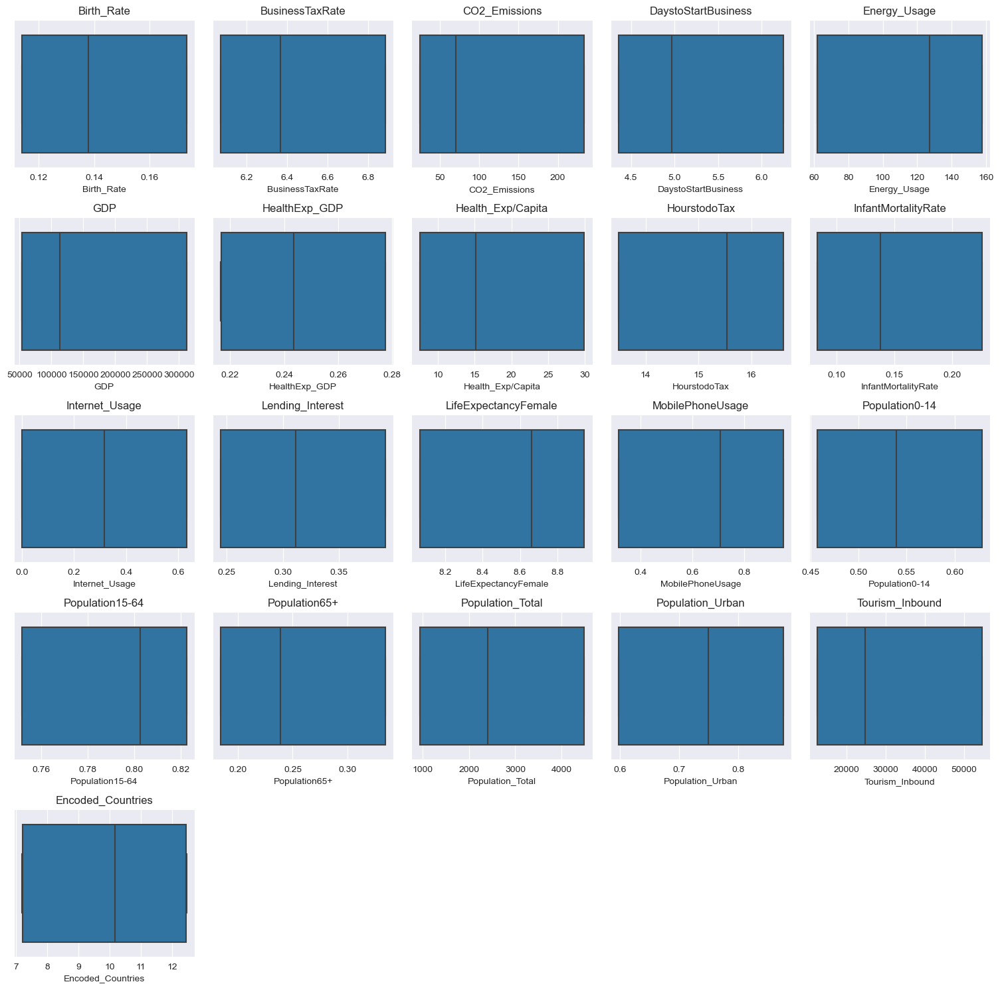

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

# Loop through each column and plot boxplot
for i, ax in enumerate(axes.flatten()):
    if i < len(df1.columns):
        sns.boxplot(x=df1[df1.columns[i]], ax=ax)
        ax.set_title(df1.columns[i])
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

#PCA

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X1 = df1.iloc[:, 0:24].values

# Standardize the features
scaler = StandardScaler()
X1_scaled = scaler.fit_transform(X1)

pca1 = PCA()
X1_pca = pca1.fit_transform(X1_scaled)

In [ ]:
X1_df=pd.DataFrame(X1_scaled)
X1_df

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-0.013527,0.548844,1.390900,0.642838,1.079432,0.725180,-1.198124,-1.072189,1.074961,0.612708,...,-0.001379,-0.387731,-1.383570,0.611616,-0.178339,-0.887953,1.327620,0.286421,-1.065989,-1.279550
1,1.301217,-0.315744,-0.146699,-0.681956,-0.713913,-0.591249,-1.198124,-1.093712,0.225417,1.335941,...,1.269292,-1.430319,-1.383570,1.233593,-1.383681,-1.100003,0.791758,-1.268826,-1.065989,-1.279550
2,1.301217,-0.315744,-0.797520,-0.681956,-1.333340,-0.987012,-1.198124,-1.093712,0.225417,1.335941,...,-1.210222,-1.430319,-1.383570,1.233593,-1.383681,-1.100003,0.015546,-1.085305,-1.065989,-1.279550
3,0.933549,-0.315744,-0.512383,-0.681956,-1.333340,-0.776258,-1.190320,-0.569297,0.225417,1.335941,...,1.269292,-1.430319,-1.383570,1.096614,-0.885949,-1.100003,-0.913586,-0.107790,-0.922357,-1.279550
4,1.301217,1.348622,-0.887518,1.082029,0.031210,-0.987012,-0.824041,-1.093712,1.074961,1.335941,...,-1.210222,-1.430319,-1.383570,1.233593,-1.383681,-1.100003,0.561775,-1.268826,-1.065989,-1.279550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-1.147094,1.348622,-0.975158,-0.153874,-1.333340,-0.987012,-1.198124,1.358827,-1.400159,-1.145160,...,-1.210222,1.096742,-0.049545,-0.034294,0.247496,0.208794,-1.188310,1.182118,-0.485891,1.170637
2700,-1.147094,1.114117,1.390900,-1.110410,1.079432,1.461790,1.269678,1.358827,-1.400159,-1.145160,...,-1.210222,1.096742,1.083043,-1.205827,0.849620,1.333714,1.327620,1.182118,1.412157,1.170637
2701,-0.797270,0.026136,-0.975158,-1.110410,0.865039,0.625812,1.269678,1.358827,1.074961,-0.860096,...,0.311288,1.096742,1.083043,-1.036725,0.254656,1.333714,-0.546743,1.182118,0.975440,1.170637
2702,-0.013527,1.348622,1.390900,1.327195,0.811932,1.461790,-1.198124,0.750000,1.074961,-0.615460,...,1.269292,0.774387,1.083043,-0.073989,0.532477,-0.119247,1.327620,1.182118,-0.034746,1.170637


In [ ]:
pca1.explained_variance_

array([8.80964427, 3.26674813, 1.26046697, 1.02575018, 1.01476317,
       0.92122075, 0.79156393, 0.67609143, 0.62936763, 0.60594578,
       0.44199769, 0.32233511, 0.27211072, 0.21957536, 0.18161593,
       0.1658029 , 0.13778167, 0.10260264, 0.08560282, 0.06174982,
       0.01503222])

In [ ]:
var1 = pca1.explained_variance_ratio_
var1

array([0.41935173, 0.15550191, 0.06000004, 0.04882718, 0.04830418,
       0.04385143, 0.03767958, 0.03218292, 0.0299588 , 0.02884389,
       0.02103973, 0.01534361, 0.01295286, 0.0104521 , 0.00864518,
       0.00789246, 0.00655861, 0.00488403, 0.00407482, 0.00293938,
       0.00071556])

In [ ]:
# Cumulative variance
cvar1=np.cumsum(np.round(var1,decimals=4)*100)
cvar1# 45   45+16=61   61+5=66 and so on

array([ 41.94,  57.49,  63.49,  68.37,  73.2 ,  77.59,  81.36,  84.58,
        87.58,  90.46,  92.56,  94.09,  95.39,  96.44,  97.3 ,  98.09,
        98.75,  99.24,  99.65,  99.94, 100.01])

In [ ]:
pca1.components_ # 23 dimensional components

array([[ 3.05635382e-01,  9.10936426e-03, -1.40345070e-01,
         1.20778282e-01, -7.29795727e-02, -1.91411736e-01,
        -1.22594283e-01, -2.90421647e-01,  4.65214012e-02,
         2.99404892e-01, -2.82090282e-01,  1.68567882e-01,
        -3.04008796e-01, -2.47225196e-01,  3.09814472e-01,
        -2.94469682e-01, -2.84099217e-01,  1.58550521e-02,
        -2.47519846e-01, -2.29160718e-01,  1.00124095e-02],
       [ 7.75660516e-02,  1.01792892e-01,  4.33479547e-01,
         4.65237863e-02,  3.94208967e-01,  4.13987401e-01,
        -1.80611747e-02, -1.09508830e-01,  2.94887589e-01,
         1.05183215e-01, -1.05698733e-01,  3.04295207e-02,
        -8.60372593e-02, -5.02077750e-02,  3.92681775e-02,
        -3.10758806e-02, -6.46736420e-02,  4.99673960e-01,
        -5.49674599e-03,  2.77010168e-01,  3.57094688e-02],
       [-1.42699358e-01,  4.89354950e-01, -3.63998289e-02,
         3.30233725e-01, -1.78075861e-01, -1.09273253e-01,
         4.43616956e-02, -5.05892774e-02,  4.35054510e

In [ ]:
pca1.n_features_

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\utils\deprecation.py:101: FutureWarning: Attribute `n_features_` was deprecated in version 1.2 and will be removed in 1.4. Use `n_features_in_` instead.
  warnings.warn(msg, category=FutureWarning)


21

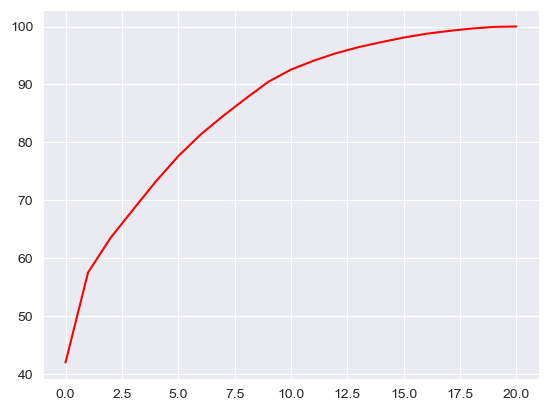

In [ ]:
plt.plot(cvar1, color="red")

#### Model 1.1 : K Means

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_

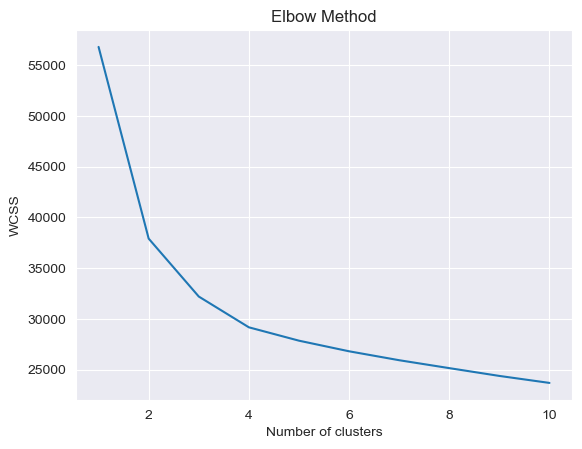

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=300,random_state=42)
    kmeans.fit(X1_df)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
#Taking cluster value as 2

In [ ]:
Kmeans11=KMeans(n_clusters=2,init='k-means++',random_state=42)
df1_predicted=Kmeans11.fit_predict(X1_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


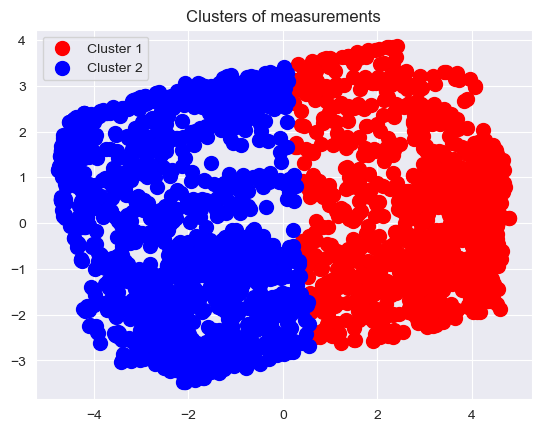

In [ ]:
plt.scatter(X1_pca[df1_predicted == 0, 0], X1_pca[df1_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X1_pca[df1_predicted == 1, 0], X1_pca[df1_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
## Accuracy check
from sklearn.metrics import silhouette_score
ss1 = silhouette_score(X1_df, df1_predicted)
print('Silhouette Score for K-means clustring :',ss1)

Silhouette Score for K-means clustring : 0.2884300104546691


In [ ]:
# Taking cluster value as 3

In [ ]:
Kmeans12=KMeans(n_clusters=3,init='k-means++',random_state=42)
df2_predicted=Kmeans12.fit_predict(X1_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


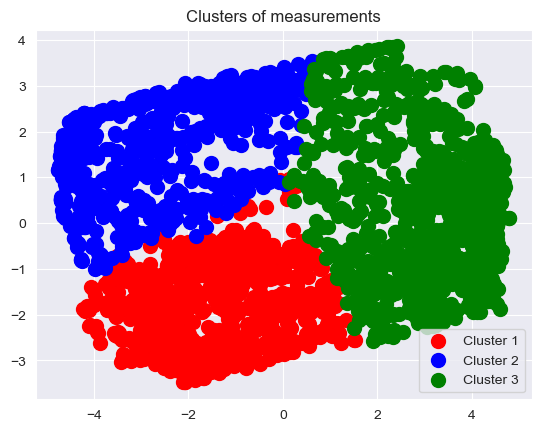

In [ ]:
plt.scatter(X1_pca[df2_predicted == 0, 0], X1_pca[df2_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X1_pca[df2_predicted == 1, 0], X1_pca[df2_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X1_pca[df2_predicted == 2, 0], X1_pca[df2_predicted == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
## Accuracy check
from sklearn.metrics import silhouette_score
ss2 = silhouette_score(X1_df, df2_predicted)
print('Silhouette Score for K-means clustring :',ss2)

Silhouette Score for K-means clustring : 0.2423605512333408


In [ ]:
# Taking cluster value as 4

In [ ]:
Kmeans13=KMeans(n_clusters=4,init='k-means++',random_state=42)
df3_predicted=Kmeans13.fit_predict(X1_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


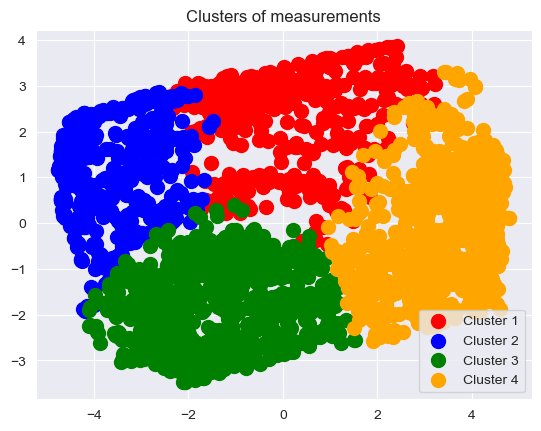

In [ ]:
plt.scatter(X1_pca[df3_predicted == 0, 0], X1_pca[df3_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X1_pca[df3_predicted == 1, 0], X1_pca[df3_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X1_pca[df3_predicted == 2, 0], X1_pca[df3_predicted == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X1_pca[df3_predicted == 3, 0], X1_pca[df3_predicted == 3, 1], s=100, c='orange', label='Cluster 4')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
## Accuracy check
from sklearn.metrics import silhouette_score
ss3 = silhouette_score(X1_df, df3_predicted)
print('Silhouette Score for K-means clustring :',ss3)

Silhouette Score for K-means clustring : 0.2213765921679667


#### Model 1.2: Hierarchical Clustering

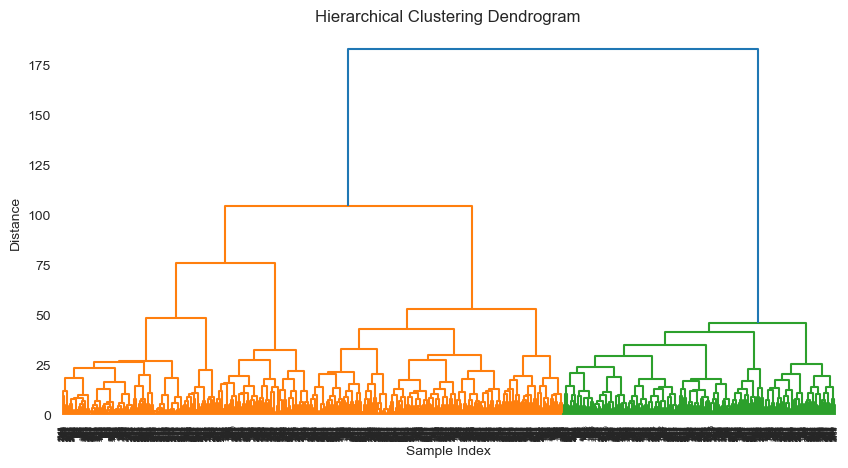

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

linked = linkage(X1_df, 'ward')  # Using Ward's method for linkage

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linked,
           orientation='top',
           labels=None,
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()

In [ ]:
#Taking cluster value as 2

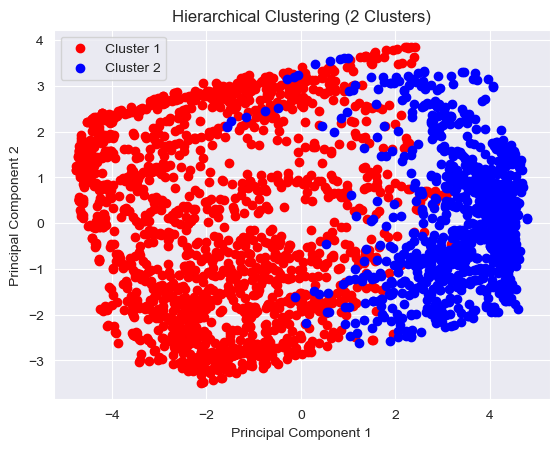

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=2)  # Adjust the number of clusters as needed
agg1 = agg_clustering.fit_predict(X1_df)

plt.scatter(X1_pca[agg1 == 0, 0], X1_pca[agg1 == 0, 1], c='red', label='Cluster 1')
plt.scatter(X1_pca[agg1== 1, 0], X1_pca[agg1 == 1, 1], c='blue', label='Cluster 2')
plt.title('Hierarchical Clustering (2 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X1_df, agg1)

0.26268757753747785

In [ ]:
# Taking cluster value as 3

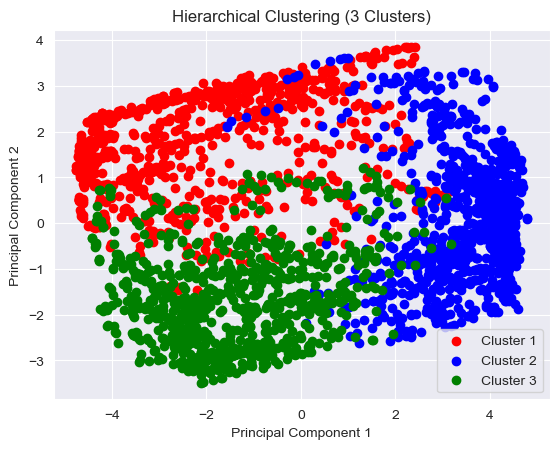

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=3)  # Adjust the number of clusters as needed
agg2 = agg_clustering.fit_predict(X1_df)

plt.scatter(X1_pca[agg2 == 0, 0], X1_pca[agg2 == 0, 1], c='red', label='Cluster 1')
plt.scatter(X1_pca[agg2== 1, 0], X1_pca[agg2== 1, 1], c='blue', label='Cluster 2')
plt.scatter(X1_pca[agg2== 2, 0], X1_pca[agg2 == 2, 1], c='green', label='Cluster 3')
plt.title('Hierarchical Clustering (3 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X1_df, agg2)

0.2105073157127548

In [ ]:
#Taking cluster value as 4

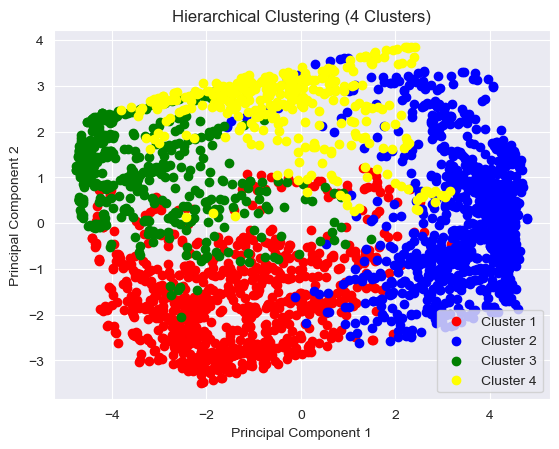

In [ ]:
agg_clustering = AgglomerativeClustering(n_clusters=4)  # Adjust the number of clusters as needed
agg3 = agg_clustering.fit_predict(X1_df)

plt.scatter(X1_pca[agg3 == 0, 0], X1_pca[agg3 == 0, 1], c='red', label='Cluster 1')
plt.scatter(X1_pca[agg3== 1, 0], X1_pca[agg3== 1, 1], c='blue', label='Cluster 2')
plt.scatter(X1_pca[agg3== 2, 0], X1_pca[agg3 == 2, 1], c='green', label='Cluster 3')
plt.scatter(X1_pca[agg3== 3, 0], X1_pca[agg3 == 3, 1], c='yellow', label='Cluster 4')
plt.title('Hierarchical Clustering (4 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X1_df, agg3)

0.18886495048244803

#### Model 1.3 : DBSCAN

In [ ]:
from sklearn.cluster import DBSCAN
db1 = DBSCAN() # default eps=0.5, min_samples=5
dbb1=db1.fit_predict(X1_df)

In [ ]:
silhouette_score(X1_df,dbb1)

-0.2794294765320121

In [ ]:
# Taking min samples as 2

In [ ]:
db2 = DBSCAN(eps=1,min_samples=2)
dbb2=db2.fit_predict(X1_df)

In [ ]:
silhouette_score(X1_df,dbb2)

0.34264271736863133

In [ ]:
#Taking min samples as 3

In [ ]:
db3 = DBSCAN(eps=1,min_samples=3)
dbb3=db3.fit_predict(X1_df)

In [ ]:
silhouette_score(X1_df,dbb3)

0.14585261131601493

In [ ]:
# Taking min samples as 4

In [ ]:
db4 = DBSCAN(eps=1,min_samples=4)
dbb4=db4.fit_predict(X1_df)

In [ ]:
silhouette_score(X1_df,dbb4)

-0.03327304669239239

In [ ]:
print("KMeans with 2 clusters:", silhouette_score(X1_df, df1_predicted))
print("KMeans with 3 clusters:", silhouette_score(X1_df, df2_predicted))
print("KMeans with 4 clusters:", silhouette_score(X1_df, df3_predicted))
print("Hierarchical clustering with 2 clusters:", silhouette_score(X1_df,agg1))
print("Hierarchical clustering with 3 clusters:", silhouette_score(X1_df,agg2))
print("Hierarchical clustering with 4 clusters:", silhouette_score(X1_df,agg3))
print("DBSCAN with default epsilon(0.5):",silhouette_score(X1_df,dbb1))
print("DBSCAN with 2 min samples:",silhouette_score(X1_df,dbb2))
print("DBSCAN with 3 min samples:",silhouette_score(X1_df,dbb3))
print("DBSCAN with 4 min samples:",silhouette_score(X1_df,dbb4))

KMeans with 2 clusters: 0.2884300104546691
KMeans with 3 clusters: 0.2423605512333408
KMeans with 4 clusters: 0.28583177865323744
Hierarchical clustering with 2 clusters: 0.26268757753747785
Hierarchical clustering with 3 clusters: 0.2105073157127548
Hierarchical clustering with 4 clusters: 0.18886495048244803
DBSCAN with default epsilon(0.5): -0.2794294765320121
DBSCAN with 2 min samples: 0.34264271736863133
DBSCAN with 3 min samples: 0.14585261131601493
DBSCAN with 4 min samples: -0.03327304669239239


### Method 2

In [ ]:
# Median Imputation on outliers
df2=df_imputed.copy()
for column in df2.columns:
    q1 = df2[column].quantile(0.25)
    q3 = df2[column].quantile(0.75)

    # Using a multiple of IQR for more flexible outlier identification
    iqr = q3 - q1
    lower_threshold = q1 - 1.5 * iqr
    upper_threshold = q3 + 1.5 * iqr

    median = df2.loc[(df2[column] > upper_threshold) | (df2[column] < lower_threshold), column].median()

    df2[column] = np.where((df2[column] > upper_threshold) | (df2[column] < lower_threshold), median, df2[column])

In [ ]:
df2

,Birth_Rate,BusinessTaxRate,CO2_Emissions,DaystoStartBusiness,Energy_Usage,GDP,HealthExp_GDP,Health_Exp/Capita,HourstodoTax,InfantMortalityRate,...,Lending_Interest,LifeExpectancyFemale,MobilePhoneUsage,Population0-14,Population15-64,Population65+,Population_Total,Population_Urban,Tourism_Inbound,Encoded_Countries
0,0.020000,44.033333,87931.000000,32.666667,26998.000000,5.479006e+10,0.035000,60.0,275.666667,0.034,...,0.100000,71.000000,0.000000,0.342,0.619000,0.039000,31719449.0,0.599,1.020000e+08,2.0
1,0.050000,40.533333,9542.000000,22.000000,7499.000000,9.129595e+09,0.034000,22.0,241.333333,0.125,...,0.402000,47.000000,0.000000,0.476,0.499000,0.025000,13924930.0,0.324,3.400000e+07,5.0
2,0.043000,40.533333,1617.000000,22.000000,1983.000000,2.359122e+09,0.043000,15.0,241.333333,0.090,...,0.056667,57.000000,0.000000,0.454,0.517000,0.029000,6949366.0,0.383,7.700000e+07,20.0
3,0.027000,40.533333,4276.000000,22.000000,1836.000000,5.788312e+09,0.047000,152.0,241.333333,0.054,...,0.155000,52.000000,0.100000,0.383,0.587000,0.029000,1755375.0,0.532,2.270000e+08,25.0
4,0.046000,54.633333,1041.000000,36.666667,13489.333333,2.610959e+09,0.051000,12.0,296.000000,0.096,...,0.056667,52.000000,0.000000,0.468,0.505000,0.028000,11607944.0,0.178,2.300000e+07,29.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.011667,48.933333,160.000000,26.000000,78.000000,2.741753e+09,0.033333,3608.0,132.000000,0.004,...,0.056667,82.666667,0.433333,0.291,0.638667,0.070333,32427.0,0.911,5.036667e+08,193.0
2700,0.013000,46.400000,79142.666667,5.000000,143976.000000,6.115256e+11,0.156000,3608.0,175.000000,0.006,...,0.033000,81.000000,1.000000,0.196,0.667000,0.136000,84980166.0,0.811,1.417800e+10,198.0
2701,0.015000,41.900000,590.333333,7.000000,22263.000000,5.000435e+10,0.089000,1308.0,310.000000,0.010,...,0.112000,80.000000,1.500000,0.220,0.639000,0.140000,3395253.0,0.948,2.222000e+09,199.0
2702,0.020000,61.900000,79142.666667,107.000000,21639.000000,6.115256e+11,0.046000,593.0,560.000000,0.013,...,0.164000,78.000000,1.000000,0.288,0.652000,0.060000,29954782.0,0.889,9.040000e+08,202.0


In [ ]:
# Checking the number of outliers
outliers_counts = count_outliers_iqr(df2)
for column, count in outliers_counts.items():
    print(f"{column}: {count}")

Birth_Rate: 0
BusinessTaxRate: 412
CO2_Emissions: 325
DaystoStartBusiness: 271
Energy_Usage: 388
GDP: 392
HealthExp_GDP: 57
Health_Exp/Capita: 467
HourstodoTax: 300
InfantMortalityRate: 19
Internet_Usage: 0
Lending_Interest: 117
LifeExpectancyFemale: 8
MobilePhoneUsage: 4
Population0-14: 0
Population15-64: 8
Population65+: 3
Population_Total: 318
Population_Urban: 0
Tourism_Inbound: 387
Encoded_Countries: 0


Even after doing Median Imputation, we can see that outliers are still present. So we will perform Outlier Cappingm

In [ ]:
for i in df2.columns:
    Q1 = df2[i].quantile(0.25)
    Q3 = df2[i].quantile(0.75)

    # Outlier capping
    df2.loc[df2[i] > Q3, i] = Q3
    df2.loc[df2[i] < Q1, i] = Q1

In [ ]:
# Let us check the outliers again
outliers_counts = count_outliers_iqr(df2)
for column, count in outliers_counts.items():
    print(f"{column}: {count}")

Birth_Rate: 0
BusinessTaxRate: 0
CO2_Emissions: 0
DaystoStartBusiness: 0
Energy_Usage: 0
GDP: 0
HealthExp_GDP: 0
Health_Exp/Capita: 0
HourstodoTax: 0
InfantMortalityRate: 0
Internet_Usage: 0
Lending_Interest: 0
LifeExpectancyFemale: 0
MobilePhoneUsage: 0
Population0-14: 0
Population15-64: 0
Population65+: 0
Population_Total: 0
Population_Urban: 0
Tourism_Inbound: 0
Encoded_Countries: 0


#### No outliers are present

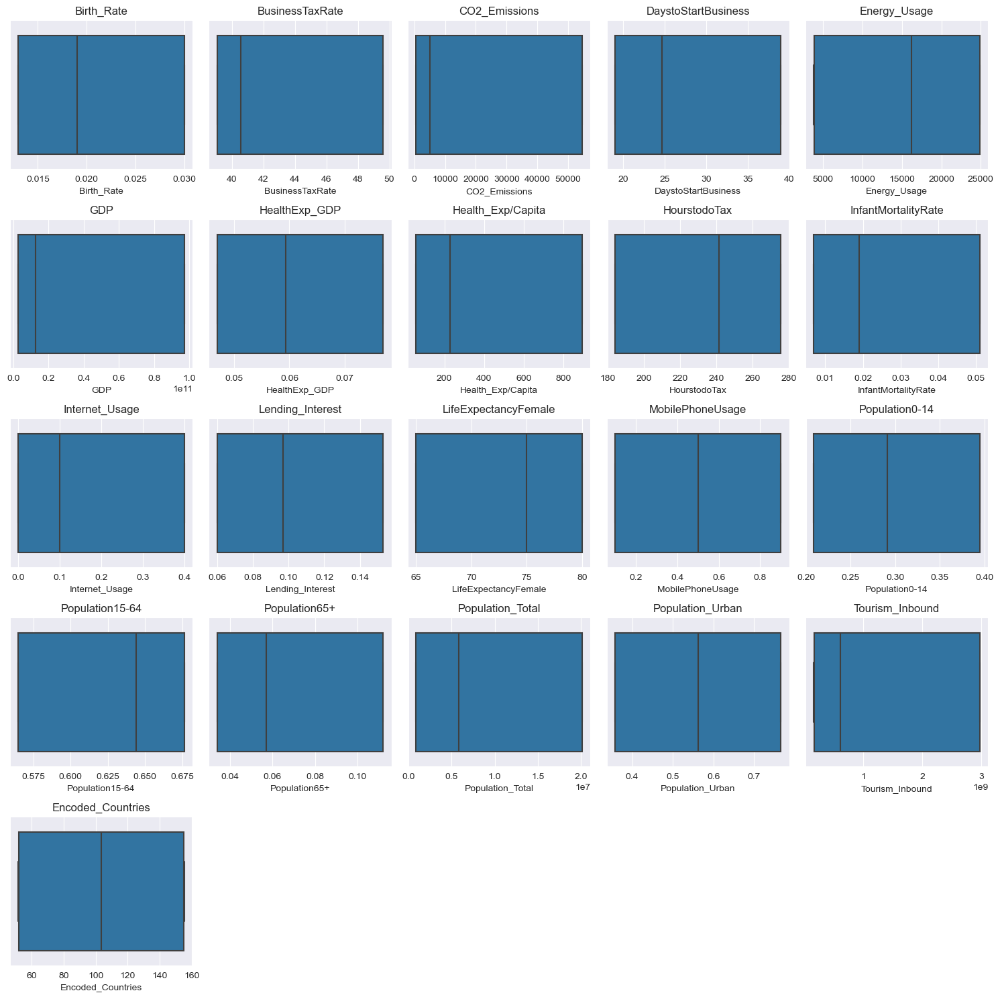

In [ ]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))

# Loop through each column and plot boxplot
for i, ax in enumerate(axes.flatten()):
    if i < len(df2.columns):
        sns.boxplot(x=df2[df2.columns[i]], ax=ax)
        ax.set_title(df2.columns[i])
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
X2 = df2.iloc[:, 0:22].values

# Standardize the features
scaler = StandardScaler()
X2_scaled = scaler.fit_transform(X2)
X2_df=pd.DataFrame(X2_scaled)

pca2 = PCA()
X2_pca = pca2.fit_transform(X2_scaled)

In [ ]:
X2_df

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-0.097508,0.138018,1.485468,0.588310,1.158404,0.479065,-1.170961,-0.954018,1.088507,0.469268,...,-0.093683,-0.408214,-1.268541,0.569360,-0.197464,-0.883775,1.451483,0.217861,-0.918670,-1.223279
1,1.342742,-0.683581,-0.452398,-0.708342,-0.834894,-0.682748,-1.170961,-0.962694,0.161850,1.415448,...,1.313588,-1.420008,-1.268541,1.263651,-1.376101,-1.038965,0.654104,-1.230316,-0.918670,-1.223279
2,1.342742,-0.683581,-0.793962,-0.708342,-1.253758,-0.841114,-1.170961,-0.962694,0.161850,1.415448,...,-1.155773,-1.420008,-1.268541,1.263651,-1.376101,-1.038965,-0.240716,-1.078745,-0.918670,-1.223279
3,0.910667,-0.683581,-0.679360,-0.708342,-1.253758,-0.767765,-1.164132,-0.687958,0.161850,1.415448,...,1.313588,-1.420008,-1.268541,1.106453,-0.895916,-1.038965,-0.906997,-0.184327,-0.860687,-1.223279
4,1.342742,1.444753,-0.818787,1.074554,-0.147601,-0.841114,-0.836320,-0.962694,1.088507,1.415448,...,-1.155773,-1.420008,-1.268541,1.263651,-1.376101,-1.038965,0.356883,-1.230316,-0.918670,-1.223279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-1.105683,1.288258,-0.837730,-0.222098,-1.253758,-0.841114,-1.170961,1.457876,-1.385577,-1.033488,...,-1.155773,1.109477,-0.251994,-0.098732,0.231792,0.088748,-1.019503,1.220329,-0.622144,1.223279
2700,-1.105683,0.693576,1.485468,-1.073026,1.158404,1.555234,1.294456,1.457876,-1.385577,-1.033488,...,-1.155773,1.109477,1.171172,-1.172917,0.850212,1.381997,1.451483,1.220329,1.506273,1.223279
2701,-0.817633,-0.362766,-0.837730,-1.073026,0.859035,0.357295,1.294456,1.457876,1.088507,-0.866515,...,0.224945,1.109477,1.171172,-1.028819,0.239067,1.381997,-0.696635,1.220329,0.859406,1.223279
2702,-0.097508,1.444753,1.485468,1.358197,0.787441,1.555234,-1.170961,0.587397,1.088507,-0.699542,...,1.313588,0.772212,1.171172,-0.138031,0.522813,-0.231977,1.451483,1.220329,-0.276976,1.223279


In [ ]:
pca2.explained_variance_

array([8.73894955, 3.23669653, 1.18704857, 1.13269804, 1.03715806,
       0.91699541, 0.77796573, 0.6699751 , 0.60841424, 0.59260657,
       0.43377273, 0.33289518, 0.28714811, 0.25488531, 0.2158151 ,
       0.18055909, 0.13960573, 0.11089538, 0.08433916, 0.05905964,
       0.01028591])

In [ ]:
var2 = pca2.explained_variance_ratio_
var2

array([0.41598656, 0.15407141, 0.05650522, 0.05391805, 0.04937021,
       0.0436503 , 0.03703229, 0.03189178, 0.02896139, 0.02820892,
       0.02064821, 0.01584629, 0.01366866, 0.01213291, 0.01027311,
       0.00859487, 0.00664543, 0.00527878, 0.00401467, 0.00281132,
       0.00048962])

In [ ]:
# Cumulative variance
cvar2=np.cumsum(np.round(var2,decimals=4)*100)
var1

array([0.41935173, 0.15550191, 0.06000004, 0.04882718, 0.04830418,
       0.04385143, 0.03767958, 0.03218292, 0.0299588 , 0.02884389,
       0.02103973, 0.01534361, 0.01295286, 0.0104521 , 0.00864518,
       0.00789246, 0.00655861, 0.00488403, 0.00407482, 0.00293938,
       0.00071556])

In [ ]:
pca2.components_

array([[-3.06560540e-01,  9.02598475e-04,  1.48260855e-01,
        -1.21770756e-01,  8.56150942e-02,  1.97320683e-01,
         1.24776263e-01,  2.83368180e-01, -4.04357058e-02,
        -2.94078845e-01,  2.83097975e-01, -1.72354787e-01,
         3.04134708e-01,  2.47815807e-01, -3.10810101e-01,
         2.94061219e-01,  2.82755178e-01, -9.62818758e-03,
         2.47847180e-01,  2.24832759e-01, -1.01801276e-02],
       [ 8.67012467e-02,  4.04697210e-02,  4.37869976e-01,
         4.90429030e-02,  4.11955238e-01,  4.05963638e-01,
        -2.66232842e-02, -1.01853686e-01,  2.84366037e-01,
         1.08637379e-01, -1.11296198e-01,  3.48279575e-02,
        -9.49147985e-02, -4.89965342e-02,  5.05523096e-02,
        -3.91164041e-02, -7.81945651e-02,  4.89701443e-01,
        -1.23560526e-02,  2.84501399e-01,  4.83377081e-02],
       [ 2.05006037e-01,  2.09102383e-01, -3.57497736e-02,
        -2.85815865e-01,  1.23606907e-01,  1.06080369e-01,
         2.66100105e-02,  1.95179182e-01, -4.37060074e

In [ ]:
pca2.n_features_

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\utils\deprecation.py:101: FutureWarning: Attribute `n_features_` was deprecated in version 1.2 and will be removed in 1.4. Use `n_features_in_` instead.
  warnings.warn(msg, category=FutureWarning)


21

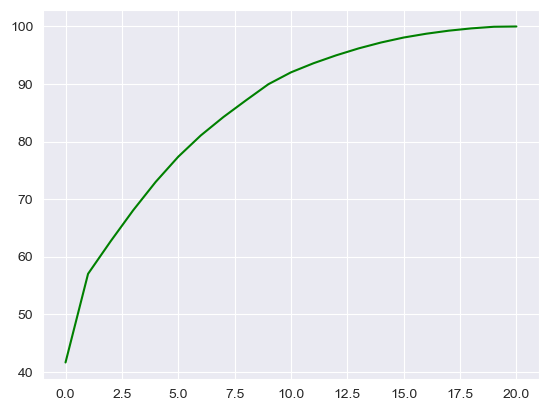

In [ ]:
plt.plot(cvar2, color="GREEN")

#### Model 2.1: K Means

In [ ]:
from sklearn.cluster import KMeans
wcss2=[]  #within cluster sum of square
for i in range(1,10):
  kmeans=KMeans(n_clusters=i,init="k-means++",random_state=1)
  kmeans.fit(X2_df)
  wcss2.append(kmeans.inertia_)

wcss2

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_

[56783.99999999999,
 38166.19867470547,
 32266.515065672535,
 29081.32001671495,
 27565.078560316055,
 26551.634950679472,
 25723.284751030158,
 24990.049789732893,
 24296.452345642727]

Text(0, 0.5, 'Inertia')

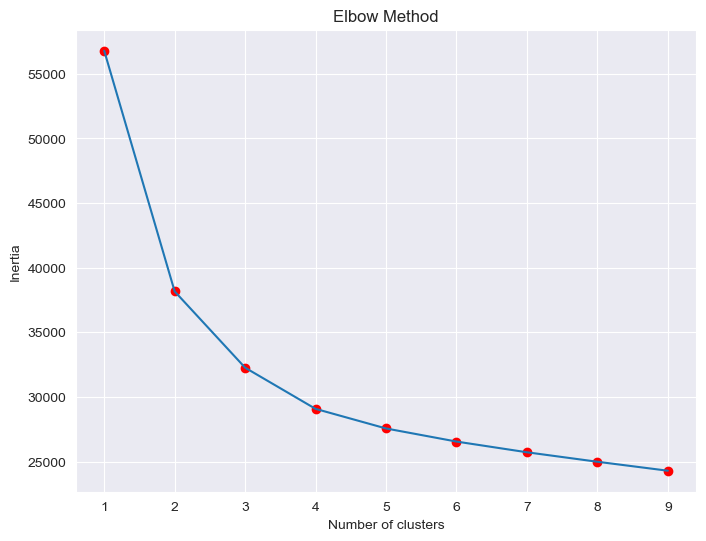

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(range(1,10),wcss2)
plt.scatter(range(1,10),wcss2,color="red")
plt.title("Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")

In [ ]:
#Taking cluster value as 2

In [ ]:
Kmeans21=KMeans(n_clusters=2,init='k-means++',random_state=42)
df21_predicted=Kmeans21.fit_predict(X2_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


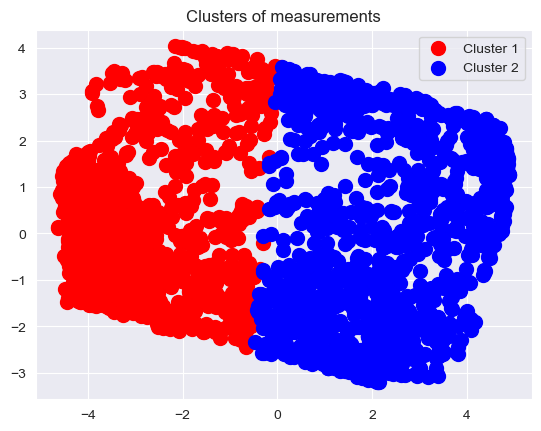

In [ ]:
plt.scatter(X2_pca[df21_predicted == 0, 0], X2_pca[df21_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X2_pca[df21_predicted == 1, 0], X2_pca[df21_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, df21_predicted)

0.2837996588382043

In [ ]:
#Taking cluster value as 3

In [ ]:
Kmeans22=KMeans(n_clusters=3,init='k-means++',random_state=42)
df22_predicted=Kmeans22.fit_predict(X2_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


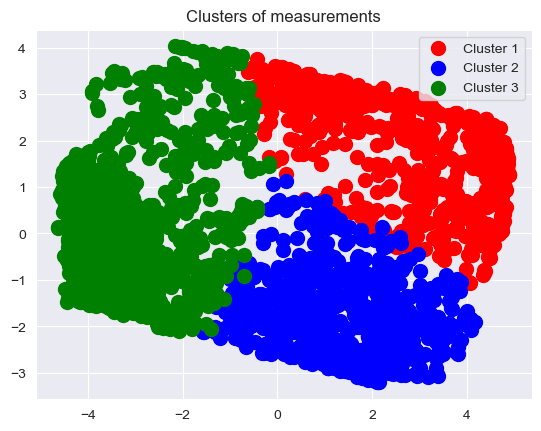

In [ ]:
plt.scatter(X2_pca[df22_predicted == 0, 0], X2_pca[df22_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X2_pca[df22_predicted == 1, 0], X2_pca[df22_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X2_pca[df22_predicted == 2, 0], X2_pca[df22_predicted == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, df22_predicted)

0.24451937985344716

In [ ]:
#Taking cluster value as 4

In [ ]:
Kmeans23=KMeans(n_clusters=4,init='k-means++',random_state=42)
df23_predicted=Kmeans23.fit_predict(X2_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


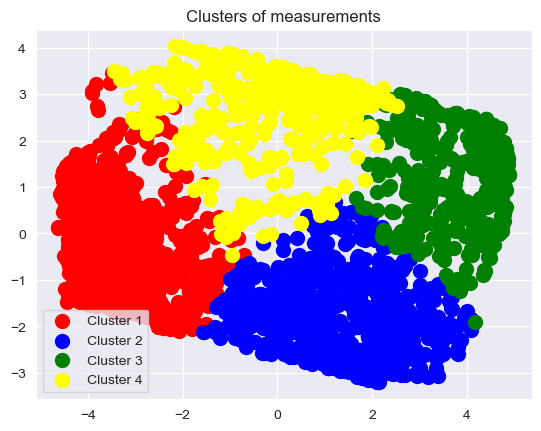

In [ ]:
plt.scatter(X2_pca[df23_predicted == 0, 0], X2_pca[df23_predicted == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X2_pca[df23_predicted == 1, 0], X2_pca[df23_predicted == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X2_pca[df23_predicted == 2, 0], X2_pca[df23_predicted == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X2_pca[df23_predicted == 3, 0], X2_pca[df23_predicted == 3, 1], s = 100, c = 'yellow', label = 'Cluster 4')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, df23_predicted)

0.2298559199614552

#### Model 2.2: Hierarchical Clustering

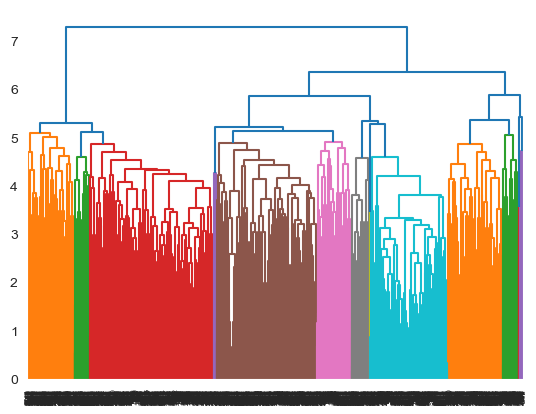

In [ ]:
dendrogram=sch.dendrogram(sch.linkage(X1_df,method="average"))

In [ ]:
# Taking cluter value as 2

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


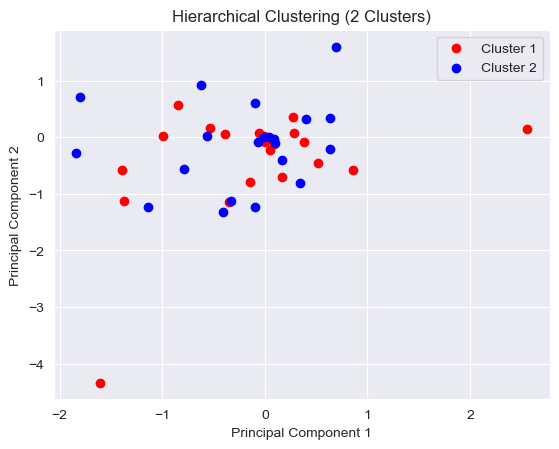

In [ ]:
hc21=AgglomerativeClustering(n_clusters=2,affinity="euclidean",linkage="average")
y21=hc21.fit_predict(X2_df)

plt.scatter(X2_pca[y21 == 0 ][0], X2_pca[y21 == 0][1], c='red', label='Cluster 1')
plt.scatter(X2_pca[y21== 1][0], X2_pca[y21 == 1][1], c='blue', label='Cluster 2')
plt.title('Hierarchical Clustering (2 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, y21)

0.23859639544797023

In [ ]:
# Taking cluter value as 3

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


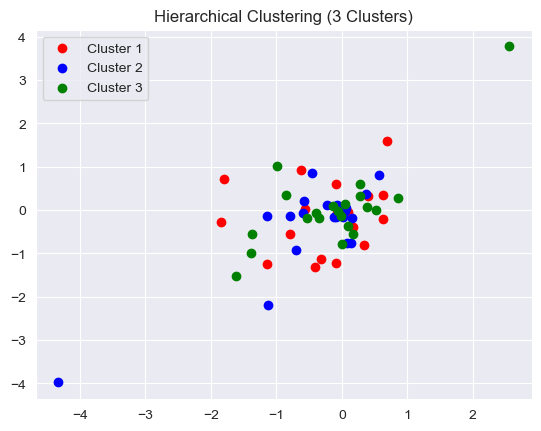

In [ ]:
hc22=AgglomerativeClustering(n_clusters=3,affinity="euclidean",linkage="average")
y22=hc22.fit_predict(X2_df)

plt.scatter(X2_pca[y22 == 0 ][0], X2_pca[y22 == 0][1], c='red', label='Cluster 1')
plt.scatter(X2_pca[y22== 1][0], X2_pca[y22 == 1][1], c='blue', label='Cluster 2')
plt.scatter(X2_pca[y22== 2][0], X2_pca[y22 == 2][1], c='green', label='Cluster 3')
plt.title('Hierarchical Clustering (3 Clusters)')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, y22)

0.20967559106886877

In [ ]:
#Taking Cluster value as 4

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


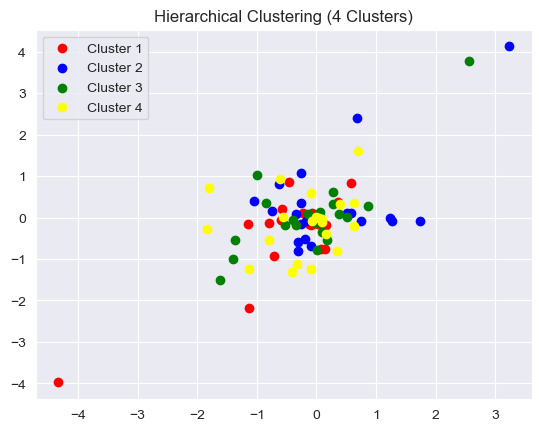

In [ ]:
hc23=AgglomerativeClustering(n_clusters=4,affinity="euclidean",linkage="average")
y23=hc23.fit_predict(X2_df)

plt.scatter(X2_pca[y23 == 0 ][0], X2_pca[y23== 0][1], c='red', label='Cluster 1')
plt.scatter(X2_pca[y23== 1][0], X2_pca[y23 == 1][1], c='blue', label='Cluster 2')
plt.scatter(X2_pca[y23== 2][0], X2_pca[y23 == 2][1], c='green', label='Cluster 3')
plt.scatter(X2_pca[y23== 3][0], X2_pca[y23 == 3][1], c='yellow', label='Cluster 4')
plt.title('Hierarchical Clustering (4 Clusters)')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X2_df, y23)

0.2092235710206122

#### Model 2.3: DBSCAN

In [ ]:
db21 = DBSCAN() # default eps=0.5, min_samples=5
ddd1=db21.fit_predict(X2_df)

In [ ]:
silhouette_score(X2_df,ddd1)

-0.2730907838923847

In [ ]:
# Taking min samples as 2

In [ ]:
db22 = DBSCAN(eps=1,min_samples=2)
ddd2=db22.fit_predict(X2_df)

In [ ]:
silhouette_score(X2_df,ddd2)

0.34201409281290424

In [ ]:
# Taking min samples as 3

In [ ]:
db23 = DBSCAN(eps=1,min_samples=3)
ddd3=db23.fit_predict(X2_df)

In [ ]:
silhouette_score(X2_df,ddd3)

0.169668415107962

In [ ]:
# Taking min samples as 4

In [ ]:
db24 = DBSCAN(eps=1,min_samples=4)
ddd4=db24.fit_predict(X2_df)

In [ ]:
silhouette_score(X2_df,ddd4)

-0.03122018040602466

In [ ]:
print("KMeans with 2 clusters:", silhouette_score(X2_df, df21_predicted))
print("KMeans with 3 clusters:", silhouette_score(X2_df, df22_predicted))
print("KMeans with 4 clusters:", silhouette_score(X2_df, df23_predicted))
print("Hierarchical clustering with 2 clusters:", silhouette_score(X2_df,y21))
print("Hierarchical clustering with 3 clusters:", silhouette_score(X2_df,y22))
print("Hierarchical clustering with 4 clusters:", silhouette_score(X2_df,y23))
print("DBSCAN with default epsilon(0.5):",silhouette_score(X2_df,ddd1))
print("DBSCAN with 2 min samples:",silhouette_score(X2_df,ddd2))
print("DBSCAN with 3 min samples:",silhouette_score(X2_df,ddd3))
print("DBSCAN with 4 min samples:",silhouette_score(X2_df,ddd4))

KMeans with 2 clusters: 0.2837996588382043
KMeans with 3 clusters: 0.24451937985344716
KMeans with 4 clusters: 0.2298559199614552
Hierarchical clustering with 2 clusters: 0.23859639544797023
Hierarchical clustering with 3 clusters: 0.20967559106886877
Hierarchical clustering with 4 clusters: 0.2092235710206122
DBSCAN with default epsilon(0.5): -0.2730907838923847
DBSCAN with 2 min samples: 0.34201409281290424
DBSCAN with 3 min samples: 0.169668415107962
DBSCAN with 4 min samples: -0.03122018040602466


### Method 3

In [ ]:
#Not removing the outliers
df3=df_imputed.copy()

In [ ]:
X3 = df3.iloc[:, 0:24].values

# Standardize the features
scaler = StandardScaler()
X3_scaled = scaler.fit_transform(X3)

pca3 = PCA(n_components=15)
X3_pca = pca3.fit_transform(X3_scaled)

In [ ]:
X3_scaled

array([[-0.2039304 , -0.08282501, -0.05032977, ...,  0.13982636,
        -0.33243141, -1.69043451],
       [ 2.45754338, -0.19559596, -0.19324452, ..., -0.97819114,
        -0.33768014, -1.64047093],
       [ 1.83653283, -0.19559596, -0.20769297, ..., -0.73832556,
        -0.33436109, -1.39065302],
       ...,
       [-0.64750936, -0.15156159, -0.20956473, ...,  1.5586922 ,
        -0.1687945 ,  1.59050734],
       [-0.2039304 ,  0.49284386, -0.06635221, ...,  1.31882663,
        -0.27052726,  1.64047093],
       [-1.00237253,  0.10190456, -0.21036023, ...,  1.56275772,
        -0.33382078,  1.67377998]])

In [ ]:
X3_df= pd.DataFrame(X3_scaled)
X3_df

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-0.203930,-0.082825,-0.050330,-0.090657,-0.135582,-0.175103,-1.127008,-0.570598,0.029956,0.085884,...,-0.180640,-0.058958,-1.237982,0.406180,-0.094875,-0.739490,0.002110,0.139826,-0.332431,-1.690435
1,2.457543,-0.195596,-0.193245,-0.311619,-0.227008,-0.217108,-1.166200,-0.594618,-0.137611,3.190349,...,6.102417,-2.306983,-1.237982,1.696071,-1.868953,-1.028884,-0.141087,-0.978191,-0.337680,-1.640471
2,1.836533,-0.195596,-0.207693,-0.311619,-0.252872,-0.223336,-0.813476,-0.599043,-0.137611,1.935352,...,-0.472770,-1.370306,-1.237982,1.484298,-1.602841,-0.946200,-0.197221,-0.738326,-0.334361,-1.390653
3,0.417080,-0.195596,-0.202845,-0.311619,-0.253561,-0.220181,-0.656710,-0.512444,-0.137611,0.746408,...,0.190142,-1.838644,-1.024461,0.800848,-0.567962,-0.946200,-0.239018,-0.132563,-0.322783,-1.307380
4,2.102680,0.258710,-0.208743,-0.007796,-0.198921,-0.223104,-0.499944,-0.600939,0.129195,2.133510,...,-0.472770,-1.838644,-1.237982,1.619063,-1.780249,-0.966871,-0.159732,-1.571757,-0.338529,-1.240762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-0.943229,0.075054,-0.210349,-0.228758,-0.261804,-0.222984,-1.192328,1.158855,-0.671221,-0.904903,...,-0.472770,1.033832,-0.312726,-0.084749,0.195877,-0.091797,-0.252883,1.408268,-0.301428,1.490580
2700,-0.824941,-0.006570,-0.066352,-0.663777,9.736451,14.718596,4.516575,5.014095,-0.461356,-0.838851,...,-0.632318,0.877719,0.897223,-0.999224,0.614756,1.265603,2.272669,1.001716,15.104242,1.573853
2701,-0.647509,-0.151562,-0.209565,-0.622347,-0.157783,-0.179505,0.989335,0.218275,0.197523,-0.706746,...,-0.099742,0.784051,1.964826,-0.768199,0.200805,1.348287,-0.225822,1.558692,-0.168794,1.590507
2702,-0.203930,0.492844,-0.066352,2.215634,-0.160709,0.125255,-0.695901,-0.233683,2.549965,-0.607667,...,0.250815,0.596716,0.897223,-0.113627,0.392997,-0.305398,-0.012091,1.318827,-0.270527,1.640471


In [ ]:
pca3.explained_variance_

array([7.42292577, 3.50431896, 1.5074412 , 1.26662206, 1.06973682,
       0.91070439, 0.82287368, 0.8090674 , 0.7517497 , 0.60966498,
       0.5120746 , 0.46353516, 0.38463617, 0.26199232, 0.23939763])

In [ ]:
var3 = pca3.explained_variance_ratio_
var3

array([0.35334193, 0.16681062, 0.07175637, 0.06029303, 0.05092101,
       0.04335084, 0.03916997, 0.03851277, 0.03578437, 0.02902093,
       0.02437549, 0.02206494, 0.01830923, 0.01247121, 0.01139567])

In [ ]:
# Cumulative variance
cvar3=np.cumsum(np.round(var3,decimals=4)*100)
cvar3

array([35.33, 52.01, 59.19, 65.22, 70.31, 74.65, 78.57, 82.42, 86.  ,
       88.9 , 91.34, 93.55, 95.38, 96.63, 97.77])

In [ ]:
pca3.components_

array([[-3.29321916e-01, -6.88909481e-02,  1.11642373e-01,
        -8.06586673e-02,  1.27814664e-01,  1.57237641e-01,
         1.30564086e-01,  2.50380194e-01, -3.70906195e-02,
        -2.96318971e-01,  2.96181275e-01, -1.13589552e-01,
         3.17757875e-01,  2.49117147e-01, -3.36226233e-01,
         3.04315536e-01,  2.96533724e-01,  3.94348037e-02,
         2.52069942e-01,  1.88306998e-01, -7.45830360e-03],
       [ 1.12781214e-01,  8.00028591e-02,  4.49448634e-01,
         1.67113264e-02,  4.82038067e-01,  4.27782710e-01,
         9.47068071e-02,  2.30153535e-02,  8.43126587e-02,
         1.25158072e-01, -8.05232107e-02,  3.05108663e-02,
        -1.24140731e-01, -1.12467971e-01,  9.07852490e-02,
        -1.04447649e-01, -4.89209818e-02,  3.58297957e-01,
        -9.65712336e-02,  3.67110122e-01,  3.83787436e-02],
       [-1.98829419e-01, -9.02563038e-02,  1.65668440e-01,
         2.15994705e-01,  8.65768694e-02, -1.39268390e-01,
        -4.56047667e-01, -3.73364204e-01,  3.17657758e

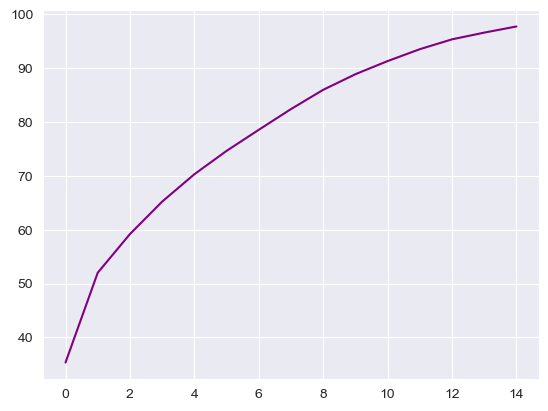

In [ ]:
plt.plot(cvar3, color="purple")

##### Model  3.1 : K Means

In [ ]:
# Inertia
c=[]
for i in range(1,11):
    kmeans3=KMeans(n_clusters=i)
    kmeans3.fit(X3_df)
    c.append(kmeans3.inertia_)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_

In [ ]:
c

[56783.99999999997,
 42421.59615865935,
 34801.022388598656,
 30962.015852141685,
 29189.51985667054,
 26630.90035846985,
 25196.76136256804,
 23440.80972025,
 22493.05854560797,
 21643.411715158014]

Text(0.5, 1.0, 'Elbow Graph')

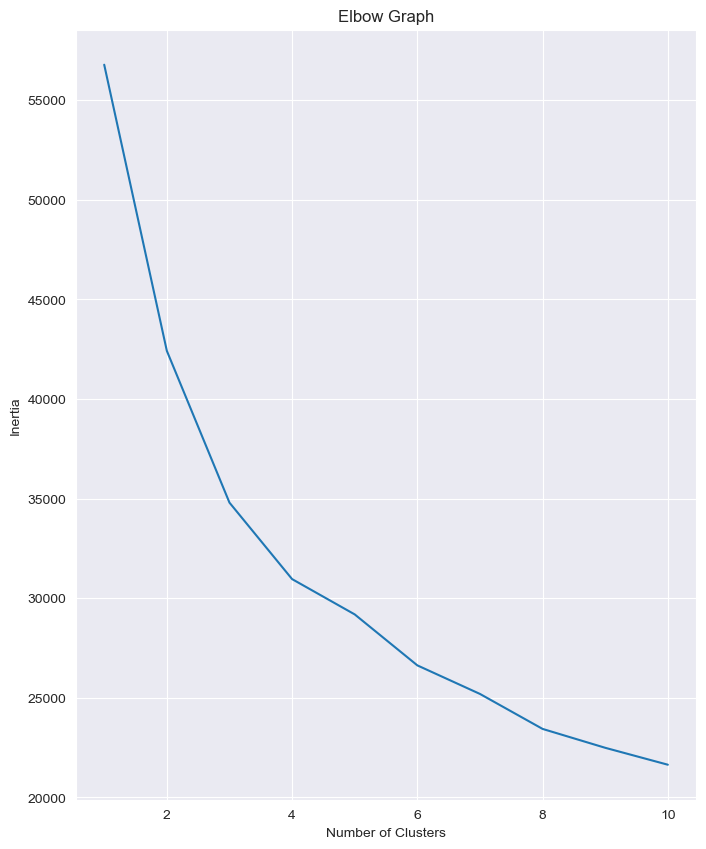

In [ ]:
# Elbow Graph
plt.figure(figsize=(8,10))
plt.plot(range(1,11),c)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Graph')

In [ ]:
# Taking cluster value as 2

In [ ]:
Kmeans31=KMeans(n_clusters=2,init='k-means++',random_state=42)
df31_predicted=Kmeans31.fit_predict(X3_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [ ]:
df31_predicted

array([0, 0, 0, ..., 1, 1, 1])

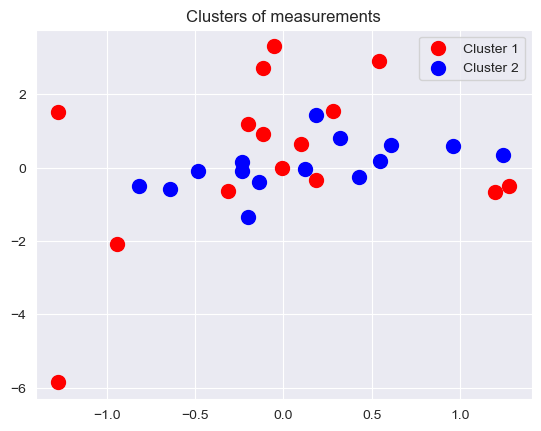

In [ ]:
plt.scatter(X3_pca[df31_predicted == 0][0], X3_pca[df31_predicted == 0][1], s=100, c='red', label='Cluster 1')
plt.scatter(X3_pca[df31_predicted == 1][0], X3_pca[df31_predicted == 1][1], s=100, c='blue', label='Cluster 2')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df, df31_predicted)

0.2771213723213554

In [ ]:
# Taking cluster value as 3

In [ ]:
Kmeans32=KMeans(n_clusters=3,init='k-means++',random_state=42)
df32_predicted=Kmeans32.fit_predict(X3_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


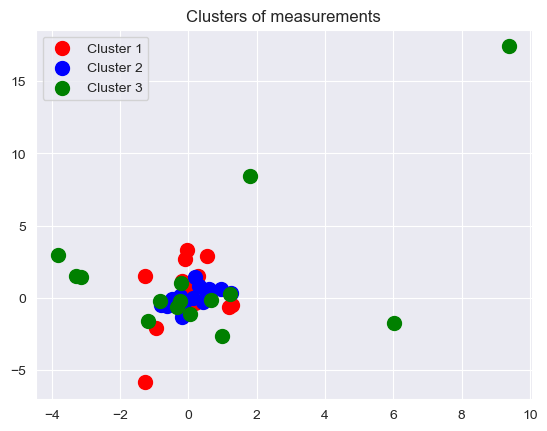

In [ ]:
plt.scatter(X3_pca[df32_predicted == 0][0], X3_pca[df32_predicted == 0][1], s=100, c='red', label='Cluster 1')
plt.scatter(X3_pca[df32_predicted == 1][0], X3_pca[df32_predicted == 1][1], s=100, c='blue', label='Cluster 2')
plt.scatter(X3_pca[df32_predicted == 2][0], X3_pca[df32_predicted == 2][1], s=100, c='green', label='Cluster 3')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df, df32_predicted)

0.29248342857068466

In [ ]:
# Taking cluster value as 4

In [ ]:
Kmeans33=KMeans(n_clusters=4,init='k-means++',random_state=42)
df33_predicted=Kmeans33.fit_predict(X3_df)

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


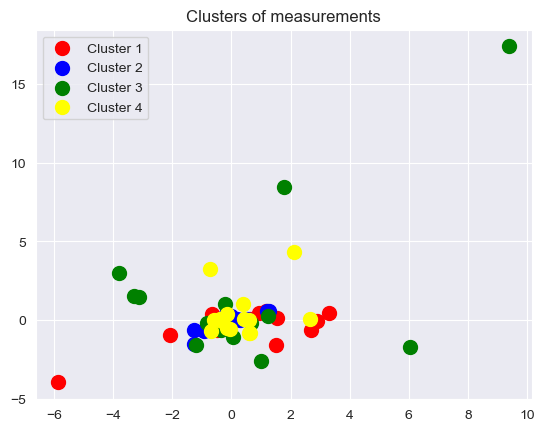

In [ ]:
plt.scatter(X3_pca[df33_predicted == 0][0], X3_pca[df33_predicted == 0][1], s=100, c='red', label='Cluster 1')
plt.scatter(X3_pca[df33_predicted == 1][0], X3_pca[df33_predicted == 1][1], s=100, c='blue', label='Cluster 2')
plt.scatter(X3_pca[df33_predicted == 2][0], X3_pca[df33_predicted == 2][1], s=100, c='green', label='Cluster 3')
plt.scatter(X3_pca[df33_predicted == 3][0], X3_pca[df33_predicted == 3][1], s=100, c='yellow', label='Cluster 4')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df, df33_predicted)

0.202791572725563

##### Model  3.2: Hierarchial Clustering

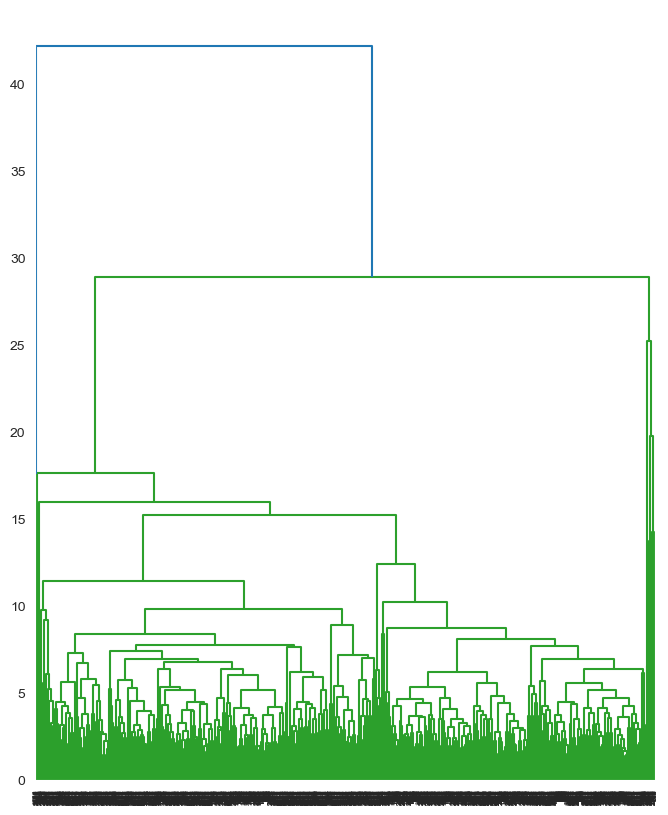

In [ ]:
#Dendogram
plt.figure(figsize=(8,10))
dendo=sch.dendrogram(sch.linkage(X3_df,'complete'))

In [ ]:
#Taking cluster value as 2

In [ ]:
#Create Clusters
hc1=AgglomerativeClustering(n_clusters=2, affinity='euclidean',linkage='complete')
hc1

AgglomerativeClustering(affinity='euclidean', linkage='complete')

In [ ]:
y1=hc1.fit_predict(X3_df)
y1

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

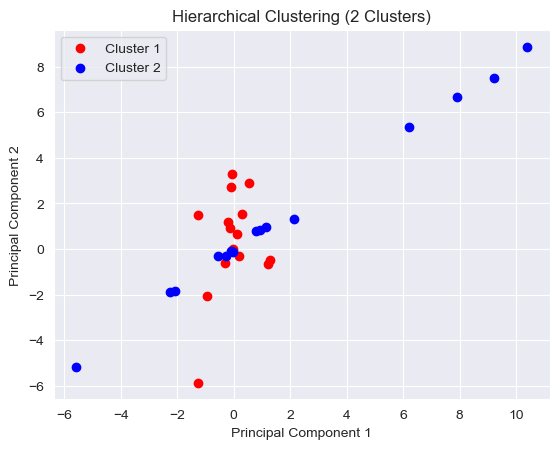

In [ ]:
plt.scatter(X3_pca[y1 == 0 ][0], X3_pca[y1 == 0][1], c='red', label='Cluster 1')
plt.scatter(X3_pca[y1== 1][0], X3_pca[y1 == 1][1], c='blue', label='Cluster 2')
plt.title('Hierarchical Clustering (2 Clusters)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df,y1)

0.7552429563600765

In [ ]:
#Taking cluster value as 3

In [ ]:
hc2=AgglomerativeClustering(n_clusters=3, affinity='euclidean',linkage='complete')
hc2

AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=3)

In [ ]:
y2=hc2.fit_predict(X3_df)
y2

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([2, 2, 2, ..., 2, 2, 2], dtype=int64)

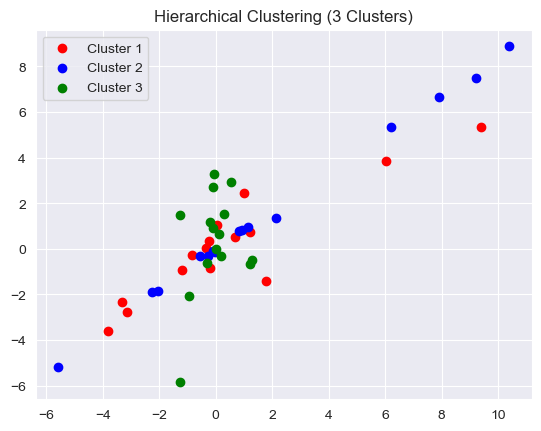

In [ ]:
plt.scatter(X3_pca[y2 == 0 ][0], X3_pca[y2 == 0][1], c='red', label='Cluster 1')
plt.scatter(X3_pca[y2== 1][0], X3_pca[y2 == 1][1], c='blue', label='Cluster 2')
plt.scatter(X3_pca[y2== 2][0], X3_pca[y2 == 2][1], c='green', label='Cluster 3')
plt.title('Hierarchical Clustering (3 Clusters)')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df,y2)

0.683989971291823

In [ ]:
#Taking cluster value as 4

In [ ]:
hc3=AgglomerativeClustering(n_clusters=4, affinity='euclidean',linkage='complete')
hc3

AgglomerativeClustering(affinity='euclidean', linkage='complete', n_clusters=4)

In [ ]:
y3=hc3.fit_predict(X3_df)
y3

C:\Users\my computer\anaconda3\anaconda\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([2, 2, 2, ..., 2, 2, 2], dtype=int64)

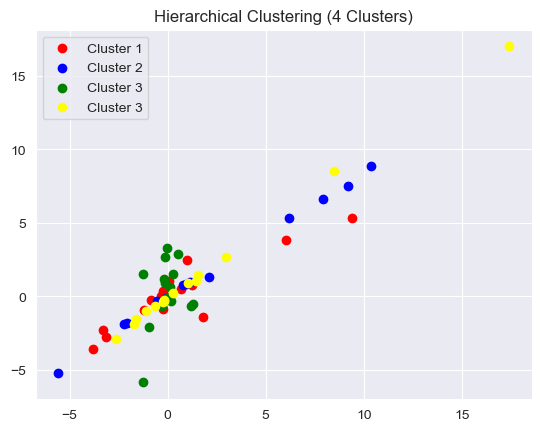

In [ ]:
plt.scatter(X3_pca[y3 == 0 ][0],X3_pca[y3 == 0][1], c='red', label='Cluster 1')
plt.scatter(X3_pca[y3== 1][0], X3_pca[y3== 1][1], c='blue', label='Cluster 2')
plt.scatter(X3_pca[y3== 2][0], X3_pca[y3 == 2][1], c='green', label='Cluster 3')
plt.scatter(X3_pca[y3== 3][0], X3_pca[y3 == 3][1], c='yellow', label='Cluster 3')
plt.title('Hierarchical Clustering (4 Clusters)')
plt.legend()
plt.show()

In [ ]:
silhouette_score(X3_df,y3)

0.6285839849115814

##### Model  3.2 :DBSCAN

In [ ]:
db31=DBSCAN()
d1=db31.fit_predict(X3_df)

In [ ]:
silhouette_score(X3_df,d1)

-0.42829513663879726

In [ ]:
# Taking min samples as 2

In [ ]:
db32 = DBSCAN(eps=1,min_samples=2)
d2=db32.fit_predict(X3_df)

In [ ]:
silhouette_score(X3_df,d2)

0.2869421931208622

In [ ]:
# Taking min samples as 3

In [ ]:
db33 = DBSCAN(eps=1,min_samples=3)
d3=db33.fit_predict(X3_df)

In [ ]:
silhouette_score(X3_df,d3)

0.22843323208216007

In [ ]:
# Taking min samples as 4

In [ ]:
db34 = DBSCAN(eps=1,min_samples=4)
d4=db34.fit_predict(X3_df)

In [ ]:
silhouette_score(X3_df,d4)

0.1432590931945535

In [ ]:
print("KMeans with 2 clusters:", silhouette_score(X3_df, df31_predicted))
print("KMeans with 3 clusters:", silhouette_score(X3_df, df32_predicted))
print("KMeans with 4 clusters:", silhouette_score(X3_df, df33_predicted))
print("Hierarchical clustering with 2 clusters:", silhouette_score(X3_df,y1))
print("Hierarchical clustering with 3 clusters:", silhouette_score(X3_df,y2))
print("Hierarchical clustering with 4 clusters:", silhouette_score(X3_df,y3))
print("DBSCAN with default epsilon(0.5):",silhouette_score(X3_df,d1))
print("DBSCAN with 2 min samples:",silhouette_score(X3_df,d2))
print("DBSCAN with 3 min samples:",silhouette_score(X3_df,d3))
print("DBSCAN with 4 min samples:",silhouette_score(X3_df,d4))

KMeans with 2 clusters: 0.2771213723213554
KMeans with 3 clusters: 0.29248342857068466
KMeans with 4 clusters: 0.202791572725563
Hierarchical clustering with 2 clusters: 0.7552429563600765
Hierarchical clustering with 3 clusters: 0.683989971291823
Hierarchical clustering with 4 clusters: 0.6285839849115814
DBSCAN with default epsilon(0.5): -0.42829513663879726
DBSCAN with 2 min samples: 0.2869421931208622
DBSCAN with 3 min samples: 0.22843323208216007
DBSCAN with 4 min samples: 0.1432590931945535
